In [3]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
from matplotlib import pyplot as plt, cm as mpl_cm
from cycler import cycler
import dandelion as ddl

sc.set_figure_params(figsize=(4, 4))
sc.set_figure_params(dpi=200, dpi_save=300)
#plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [5]:
fig_dir = '/Users/chengyuye/Library/CloudStorage/OneDrive-EmoryUniversity/Rotation_2_Li Lab/scRNA_TCR/Figures/adipose_updated/TCR_final/'
matrix_input = f'/Users/chengyuye/Library/CloudStorage/OneDrive-EmoryUniversity/Rotation_2_Li Lab/scRNA_TCR/Data/processed_data/adipose/seurat_update'

In [6]:
adata = sc.read_h5ad(os.path.join(matrix_input,'subset_adipose_harmony_res0.4_final.h5ad'))

In [4]:
adata.shape

adata.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,percent.mt,percent.rb,HTO_maxID,HTO_secondID,HTO_margin,HTO_classification,...,Group,RNA_snn_res.0.5,seurat_clusters,RNA_snn_res.0.3,RNA_snn_res.0.4,RNA_snn_res.0.2,RNA_snn_res.0.25,RNA_snn_res.0.35,RNA_snn_res.0.38,RNA_snn_res.0.36
AAACCTGCAAACGCGA-1,3006.0,1610,3923.0,2,1.862941,16.001331,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.903188,Hash1Mouse-C0301-TotalSeqC,...,Srebf2WT,4,4,3,4,2,2,3,4,4
AAACCTGCACCACCAG-1,7585.0,2632,1746.0,2,1.977587,17.191826,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,1.954413,Hash1Mouse-C0301-TotalSeqC,...,Srebf2WT,1,1,2,1,0,0,0,5,5
AAACCTGGTTATCCGA-1,2301.0,1139,9184.0,2,1.955671,18.904824,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,3.697296,Hash1Mouse-C0301-TotalSeqC,...,Srebf2WT,1,1,2,1,1,1,1,3,2
AAACCTGTCTGTGCAA-1,3766.0,1556,1581.0,2,0.424854,19.171535,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.071279,Hash1Mouse-C0301-TotalSeqC,...,Srebf2WT,2,2,1,2,1,1,1,3,2
AAACGGGAGGCTCTTA-1,4207.0,1878,1858.0,2,1.022106,12.455431,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.261264,Hash1Mouse-C0301-TotalSeqC,...,Srebf2WT,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGATGTTAG-1,3381.0,1608,1748.0,2,0.798580,10.499852,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.457329,Hash2Mouse-C0302-TotalSeqC,...,Srebf2KO,0,0,0,0,0,0,0,0,0
TTTGTCAAGCGGCTTC-1,2620.0,1396,2698.0,2,0.458015,13.549618,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.856161,Hash2Mouse-C0302-TotalSeqC,...,Srebf2KO,1,1,0,1,0,0,2,1,0
TTTGTCAGTCTCACCT-1,3439.0,1745,7378.0,2,0.988659,15.789474,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,2.390347,Hash2Mouse-C0302-TotalSeqC,...,Srebf2KO,3,2,3,2,1,1,1,3,2
TTTGTCAGTGCTAGCC-1,2045.0,1218,1727.0,2,0.537897,16.234719,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.462959,Hash2Mouse-C0302-TotalSeqC,...,Srebf2KO,4,4,3,4,2,2,3,4,4


In [7]:
adata_tcr = ir.io.read_10x_vdj('/Users/chengyuye/Library/CloudStorage/OneDrive-EmoryUniversity/Rotation_2_Li Lab/scRNA_TCR/Data/p22285-s001_Adipose-Tregs_WT-KO-mix/vdj_t/filtered_contig_annotations.csv')

In [6]:
adata_tcr.obs

,is_cell,high_confidence,multi_chain,extra_chains,IR_VJ_1_c_call,IR_VJ_2_c_call,IR_VDJ_1_c_call,IR_VDJ_2_c_call,IR_VJ_1_consensus_count,IR_VJ_2_consensus_count,...,IR_VDJ_2_locus,IR_VJ_1_productive,IR_VJ_2_productive,IR_VDJ_1_productive,IR_VDJ_2_productive,IR_VJ_1_v_call,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,has_ir
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGTTGTAGA-1,True,True,False,[],TRAC,NaN,TRBC1,NaN,5204.0,NaN,...,NaN,True,None,True,None,TRAV5-4,NaN,TRBV1,NaN,True
AAACCTGCAAACGCGA-1,True,True,False,[],TRAC,NaN,NaN,NaN,8522.0,NaN,...,NaN,True,None,None,None,TRAV13-1,NaN,NaN,NaN,True
AAACCTGCAATCGGTT-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,1546.0,NaN,...,NaN,True,None,True,None,TRAV10,NaN,TRBV26,NaN,True
AAACCTGCACCACCAG-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,7866.0,NaN,...,NaN,True,None,True,None,TRAV14N-2,NaN,TRBV12-2,NaN,True
AAACCTGCACGAAATA-1,True,True,False,[],TRAC,NaN,TRBC1,NaN,5034.0,NaN,...,NaN,True,None,True,None,TRAV6D-6,NaN,TRBV12-2+TRBV13-2,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGCTAGCC-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,4250.0,NaN,...,NaN,True,None,True,None,TRAV7D-2,NaN,TRBV3,NaN,True
TTTGTCAGTTCCTCCA-1,True,True,False,[],TRAC,NaN,NaN,NaN,6832.0,NaN,...,NaN,True,None,None,None,TRAV3-1,NaN,NaN,NaN,True
TTTGTCATCACTATTC-1,True,True,False,[],TRAC,NaN,TRBC1,NaN,3054.0,NaN,...,NaN,True,None,True,None,TRAV12-2,NaN,TRBV3,NaN,True


In [8]:
ir.pp.merge_with_ir(adata, adata_tcr)

In [8]:
adata.obs_keys()

['nCount_RNA',
 'nFeature_RNA',
 'nCount_HTO',
 'nFeature_HTO',
 'percent.mt',
 'percent.rb',
 'HTO_maxID',
 'HTO_secondID',
 'HTO_margin',
 'HTO_classification',
 'hash.ID',
 'Group',
 'RNA_snn_res.0.5',
 'seurat_clusters',
 'RNA_snn_res.0.3',
 'RNA_snn_res.0.4',
 'RNA_snn_res.0.2',
 'RNA_snn_res.0.25',
 'RNA_snn_res.0.35',
 'RNA_snn_res.0.38',
 'RNA_snn_res.0.36',
 'is_cell',
 'high_confidence',
 'multi_chain',
 'extra_chains',
 'IR_VJ_1_c_call',
 'IR_VJ_2_c_call',
 'IR_VDJ_1_c_call',
 'IR_VDJ_2_c_call',
 'IR_VJ_1_consensus_count',
 'IR_VJ_2_consensus_count',
 'IR_VDJ_1_consensus_count',
 'IR_VDJ_2_consensus_count',
 'IR_VJ_1_d_call',
 'IR_VJ_2_d_call',
 'IR_VDJ_1_d_call',
 'IR_VDJ_2_d_call',
 'IR_VJ_1_duplicate_count',
 'IR_VJ_2_duplicate_count',
 'IR_VDJ_1_duplicate_count',
 'IR_VDJ_2_duplicate_count',
 'IR_VJ_1_j_call',
 'IR_VJ_2_j_call',
 'IR_VDJ_1_j_call',
 'IR_VDJ_2_j_call',
 'IR_VJ_1_junction',
 'IR_VJ_2_junction',
 'IR_VDJ_1_junction',
 'IR_VDJ_2_junction',
 'IR_VJ_1_junction

In [9]:
ir.tl.chain_qc(adata)
ir.tl.chain_pairing(adata)

/var/folders/rs/52m_gf5n26g06bdsjhchmbdm0000gn/T/ipykernel_38113/3293523500.py:2: FutureWarning: chain_pairing is a deprecated function and will be removed in a future version of scirpy. Use `tl.chain_qc` instead.


## Define clonotypes and clonotype clusters

### select only single pair cells

In [10]:
adata.obs.chain_pairing.unique()

array(['orphan VJ', 'single pair', 'no IR', 'orphan VDJ', 'extra VDJ',
       'extra VJ', 'two full chains'], dtype=object)

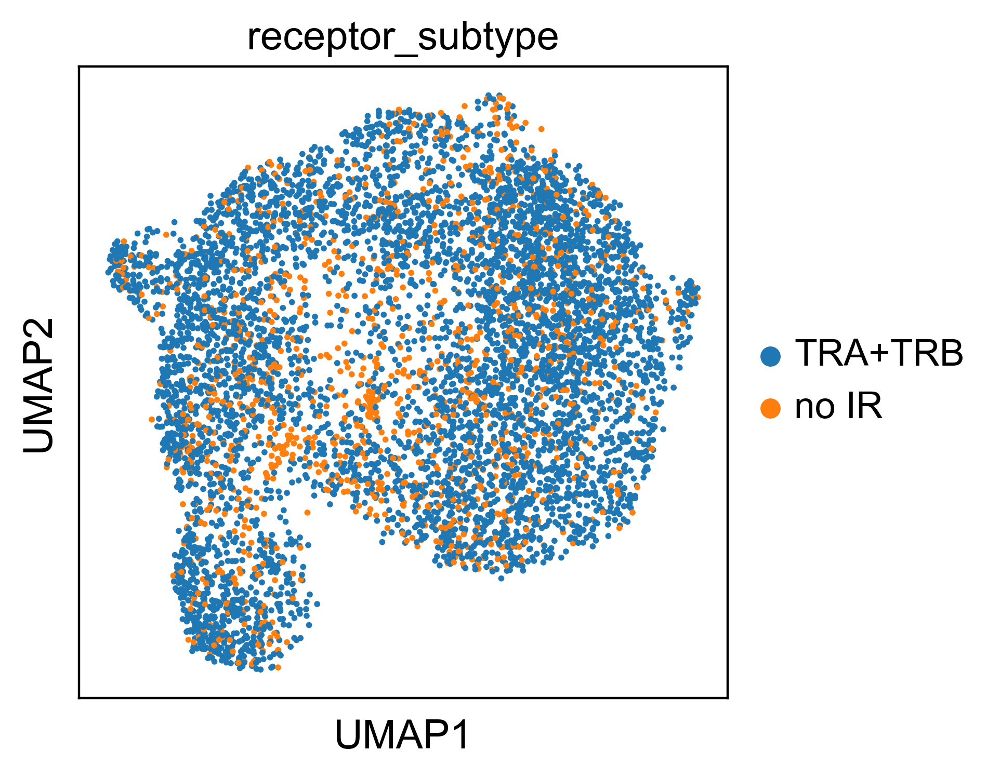

In [13]:
sc.pl.umap(adata,color='receptor_subtype')

In [11]:
## remove no IR
adata = adata[adata.obs["chain_pairing"] != "no IR"]

In [12]:
adata.obs["chain_pairing"].unique()

array(['orphan VJ', 'single pair', 'orphan VDJ', 'extra VDJ', 'extra VJ',
       'two full chains'], dtype=object)

/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/anndata/_core/anndata.py:1236: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'receptor_type' as categorical
/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
Trying to set attribute `.obs` of view, copying.
... storing 'receptor_subtype' as categorical
/Users/chengyuye/miniconda3/envs/single

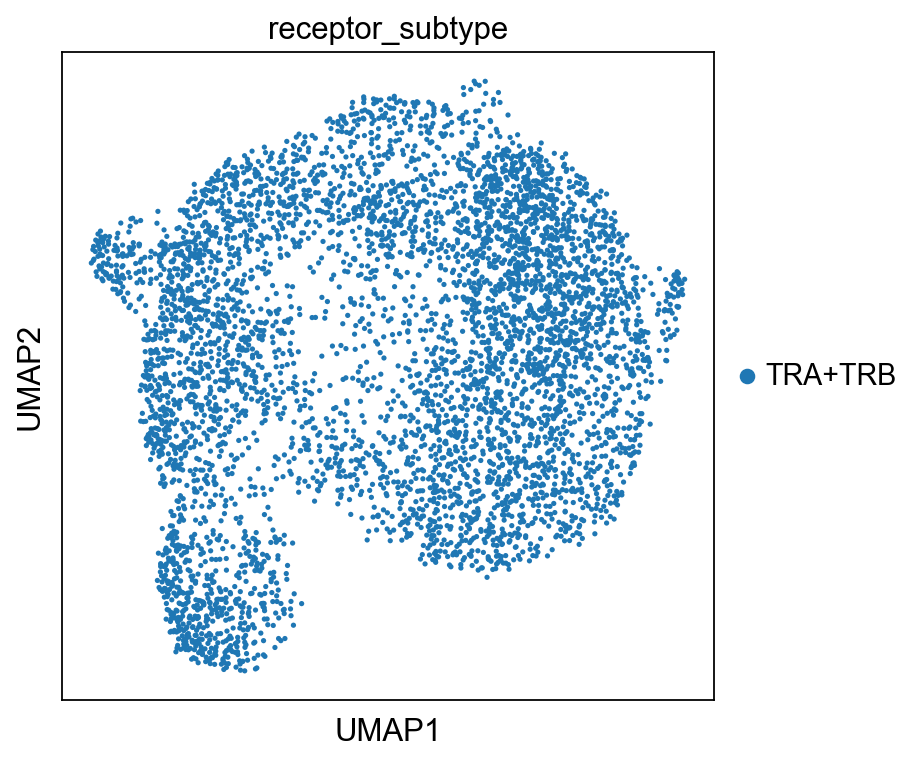

In [13]:
sc.set_figure_params(figsize=(6, 5))
sc.pl.umap(adata,color='receptor_subtype', show=False, legend_loc='right margin')
plt.tight_layout()
#plt.savefig(fig_dir+'TCR_umap_without_removing.pdf')
#plt.savefig(fig_dir+'TCR_umap_removing_noIR.pdf')

Trying to set attribute `._uns` of view, copying.


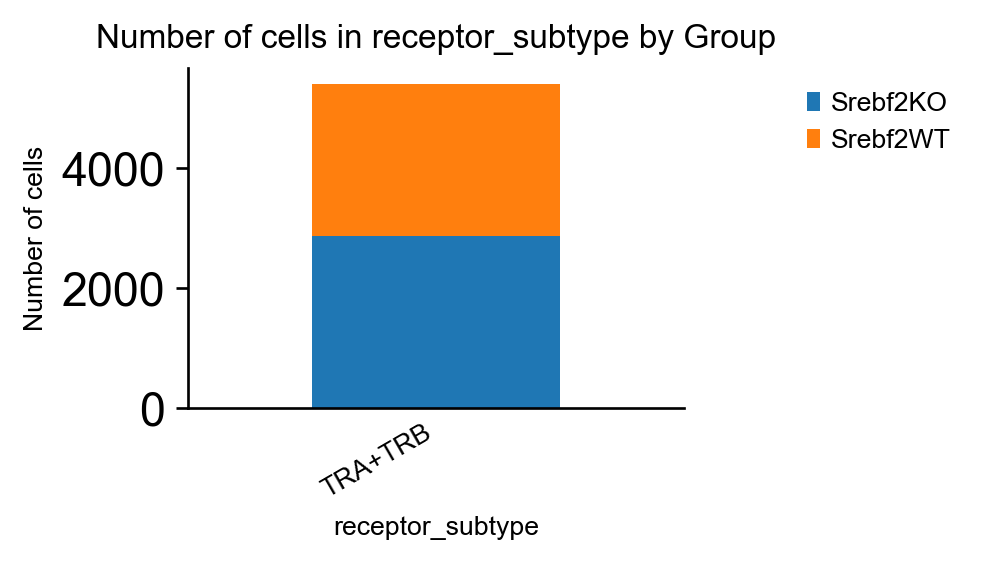

In [17]:

ax = ir.pl.group_abundance(adata, groupby="receptor_subtype", target_col="Group")
#plt.tight_layout()
#plt.savefig(fig_dir+'TCR_Group_abundance_without_removing.pdf',bbox_inches='tight')
#plt.savefig(fig_dir+'TCR_Group_abundance_removing_noIR.pdf',bbox_inches='tight')

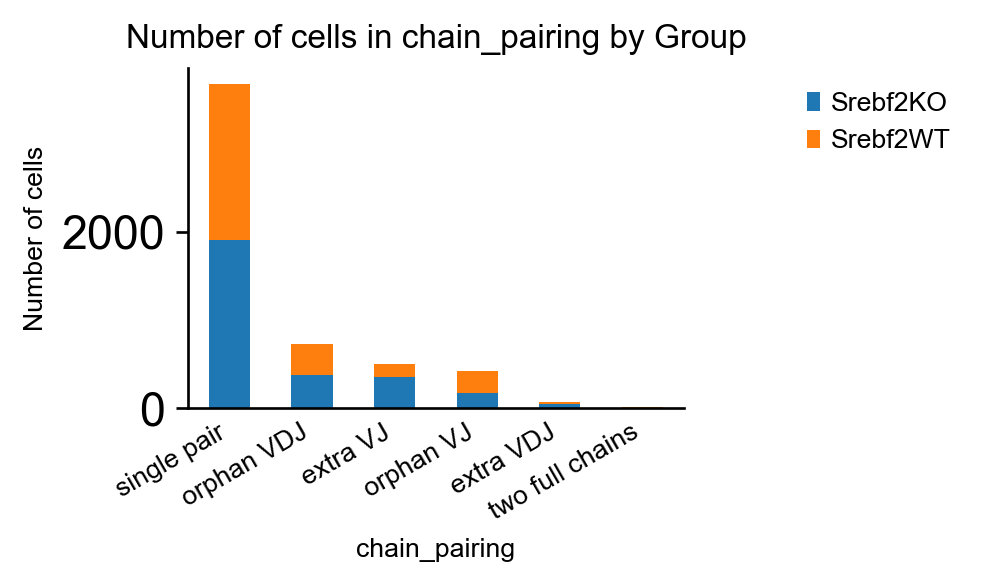

In [18]:

#sc.set_figure_params(figsize=(10, 5))
ax = ir.pl.group_abundance(adata, groupby="chain_pairing", target_col="Group")

#plt.savefig(fig_dir+'TCR_chain_pairing_abundance_without_removing.pdf',bbox_inches='tight', pad_inches=0)
#plt.savefig(fig_dir+'TCR_chain_pairing_abundance_removing_noIR.pdf',bbox_inches='tight')

In [19]:
print(
    "Fraction of cells with more than one pair of TCRs: {:.2f}".format(
        np.sum(
            adata.obs["chain_pairing"].isin(
                ["extra VJ", "extra VDJ", "two full chains"]
            )
        )
        / adata.n_obs
    )
)

Fraction of cells with more than one pair of TCRs: 0.11


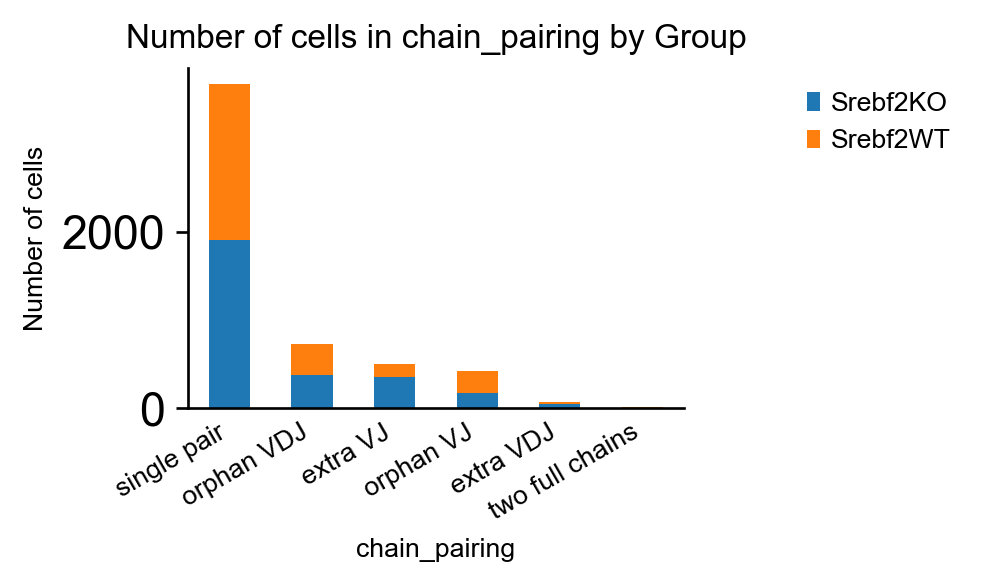

In [20]:
ax = ir.pl.group_abundance(adata, groupby="chain_pairing", target_col="Group")

In [ ]:
adata.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,percent.mt,HTO_maxID,HTO_secondID,HTO_margin,HTO_classification,hash.ID,...,IR_VDJ_1_productive,IR_VDJ_2_productive,IR_VJ_1_v_call,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,has_ir,receptor_type,receptor_subtype,chain_pairing
AAACCTGCAAACGCGA-1,3006.0,1610,3923.0,2,1.862941,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.910854,Hash1Mouse-C0301-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,...,None,None,TRAV13-1,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ
AAACCTGCACCACCAG-1,7585.0,2632,1746.0,2,1.977587,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,1.958334,Hash1Mouse-C0301-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,...,True,None,TRAV14N-2,NaN,TRBV12-2,NaN,True,TCR,TRA+TRB,single pair
AAACCTGTCTGTGCAA-1,3766.0,1556,1581.0,2,0.424854,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.078687,Hash1Mouse-C0301-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,...,None,None,TRAV7-6,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ
AAACGGGAGGCTCTTA-1,4207.0,1878,1858.0,2,1.022106,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.269674,Hash1Mouse-C0301-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,...,True,None,TRAV14N-2,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair
AAACGGGCAAAGGAAG-1,2157.0,1067,10336.0,2,0.973574,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,3.643749,Hash1Mouse-C0301-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,...,True,None,TRAV5N-4,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGCGGCTTC-1,2620.0,1396,2698.0,2,0.458015,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.877800,Hash2Mouse-C0302-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,...,True,None,TRAV7D-2,NaN,TRBV26,NaN,True,TCR,TRA+TRB,single pair
TTTGTCAGTCTCACCT-1,3439.0,1745,7378.0,2,0.988659,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,2.411079,Hash2Mouse-C0302-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,...,True,None,TRAV14N-3,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair
TTTGTCAGTGCTAGCC-1,2045.0,1218,1727.0,2,0.537897,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.482639,Hash2Mouse-C0302-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,...,True,None,TRAV7D-2,NaN,TRBV3,NaN,True,TCR,TRA+TRB,single pair
TTTGTCAGTTCCTCCA-1,4445.0,1958,2331.0,2,1.417323,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.769364,Hash2Mouse-C0302-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,...,None,None,TRAV3-1,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ


## Define clonetypes

In [14]:
# using default parameters, `ir_dist` will compute nucleotide sequence identity
ir.pp.ir_dist(adata)
ir.tl.define_clonotypes(adata, receptor_arms="all", dual_ir="primary_only")

Computing sequence x sequence distance matrix for VJ sequences.
Computing sequence x sequence distance matrix for VDJ sequences.
Initializing lookup tables. 
Computing clonotype x clonotype distances.


100%|██████████| 2259/2259 [00:01<00:00, 1602.31it/s]


Stored clonal assignments in `adata.obs["clone_id"]`.


In [ ]:
adata.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,percent.mt,percent.rb,HTO_maxID,HTO_secondID,HTO_margin,HTO_classification,...,IR_VJ_1_v_call,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,has_ir,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size
AAACCTGCAAACGCGA-1,3006.0,1610,3923.0,2,1.862941,16.001331,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.903188,Hash1Mouse-C0301-TotalSeqC,...,TRAV13-1,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ,0,1.0
AAACCTGCACCACCAG-1,7585.0,2632,1746.0,2,1.977587,17.191826,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,1.954413,Hash1Mouse-C0301-TotalSeqC,...,TRAV14N-2,NaN,TRBV12-2,NaN,True,TCR,TRA+TRB,single pair,1,75.0
AAACCTGGTTATCCGA-1,2301.0,1139,9184.0,2,1.955671,18.904824,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,3.697296,Hash1Mouse-C0301-TotalSeqC,...,NaN,NaN,NaN,NaN,None,no IR,no IR,no IR,NaN,NaN
AAACCTGTCTGTGCAA-1,3766.0,1556,1581.0,2,0.424854,19.171535,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.071279,Hash1Mouse-C0301-TotalSeqC,...,TRAV7-6,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ,2,1.0
AAACGGGAGGCTCTTA-1,4207.0,1878,1858.0,2,1.022106,12.455431,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.261264,Hash1Mouse-C0301-TotalSeqC,...,TRAV14N-2,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair,3,96.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACACGAGAGT-1,15477.0,3965,7906.0,2,1.014408,18.194741,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,2.782717,Hash2Mouse-C0302-TotalSeqC,...,NaN,NaN,NaN,NaN,None,no IR,no IR,no IR,NaN,NaN
TTTGTCAGTCTCACCT-1,3439.0,1745,7378.0,2,0.988659,15.789474,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,2.390347,Hash2Mouse-C0302-TotalSeqC,...,TRAV14N-3,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair,2290,1.0
TTTGTCAGTGCTAGCC-1,2045.0,1218,1727.0,2,0.537897,16.234719,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.462959,Hash2Mouse-C0302-TotalSeqC,...,TRAV7D-2,NaN,TRBV3,NaN,True,TCR,TRA+TRB,single pair,927,11.0
TTTGTCAGTTCCTCCA-1,4445.0,1958,2331.0,2,1.417323,13.655793,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.748074,Hash2Mouse-C0302-TotalSeqC,...,TRAV3-1,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ,1112,4.0


In [22]:
ir.tl.clonotype_network(adata, min_cells=2)

/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'clone_id' as categorical


<AxesSubplot:>

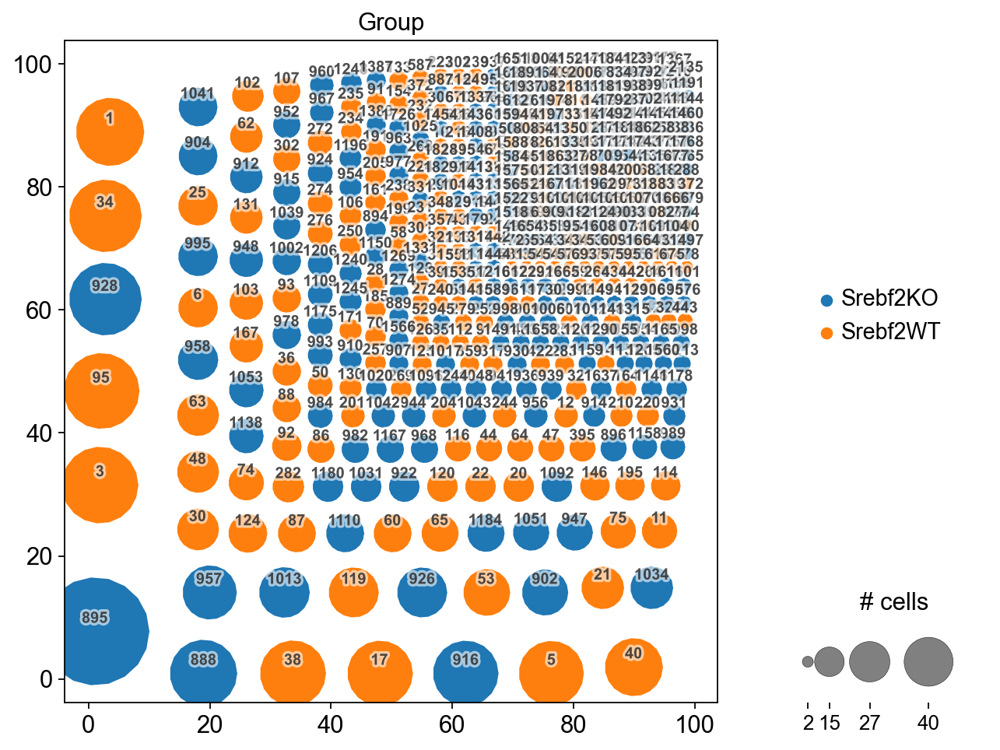

In [23]:
ir.pl.clonotype_network(
    adata, color="Group", base_size=20, label_fontsize=9, panel_size=(7, 7)
)

### Re-compute CDR3 neighborhood graph and define clonotype clusters

In [ ]:
ir.pp.ir_dist(
    adata,
    metric="alignment",
    sequence="aa",
    cutoff=15,
)

Computing sequence x sequence distance matrix for VJ sequences.


100%|██████████| 630/630 [00:17<00:00, 35.57it/s]


Computing sequence x sequence distance matrix for VDJ sequences.


100%|██████████| 703/703 [00:17<00:00, 40.12it/s]


In [ ]:
ir.tl.define_clonotype_clusters(
    adata, sequence="aa", metric="alignment", receptor_arms="all", dual_ir="any"
)

Initializing lookup tables. 
Computing clonotype x clonotype distances.


100%|██████████| 2331/2331 [00:04<00:00, 466.35it/s]

Stored clonal assignments in `adata.obs["cc_aa_alignment"]`.


In [ ]:
ir.tl.clonotype_network(adata, min_cells=3, sequence="aa", metric="alignment")

/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cc_aa_alignment' as categorical


<AxesSubplot:>

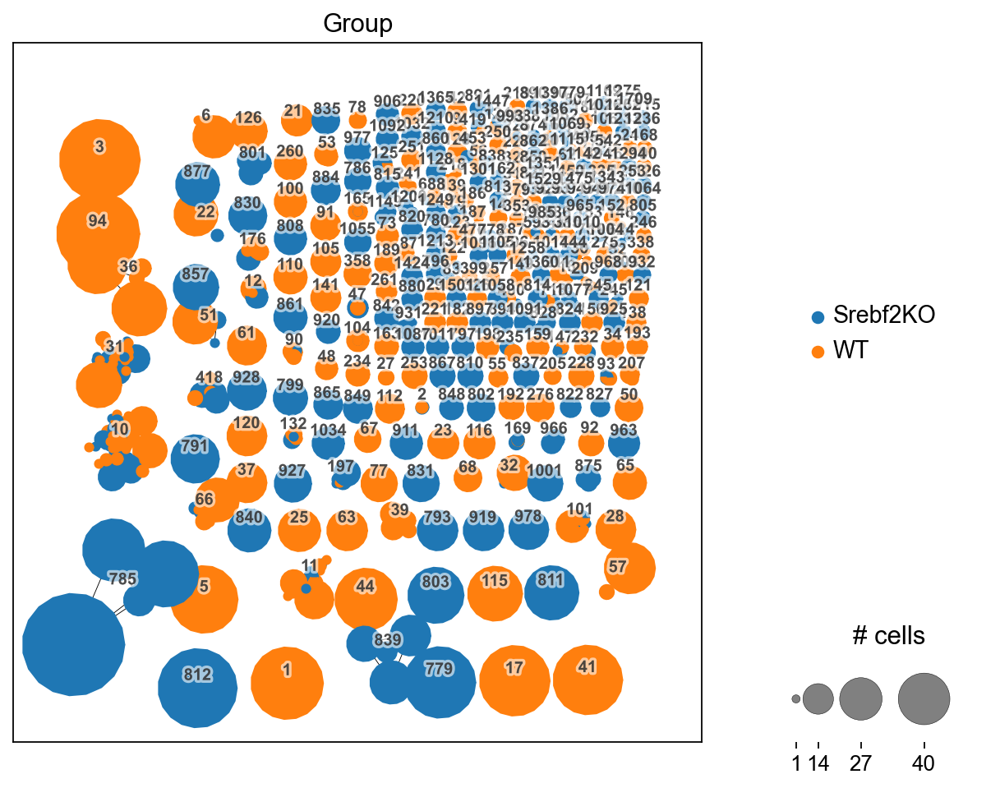

In [ ]:
ir.pl.clonotype_network(
    adata, color="Group", label_fontsize=9, panel_size=(7, 7), base_size=20
)

In [ ]:
adata.obs_keys()

['nCount_RNA',
 'nFeature_RNA',
 'nCount_HTO',
 'nFeature_HTO',
 'percent.mt',
 'HTO_maxID',
 'HTO_secondID',
 'HTO_margin',
 'HTO_classification',
 'hash.ID',
 'Group',
 'RNA_snn_res.0.5',
 'seurat_clusters',
 'RNA_snn_res.0.4',
 'RNA_snn_res.0.3',
 'RNA_snn_res.0.2',
 'is_cell',
 'high_confidence',
 'multi_chain',
 'extra_chains',
 'IR_VJ_1_c_call',
 'IR_VJ_2_c_call',
 'IR_VDJ_1_c_call',
 'IR_VDJ_2_c_call',
 'IR_VJ_1_consensus_count',
 'IR_VJ_2_consensus_count',
 'IR_VDJ_1_consensus_count',
 'IR_VDJ_2_consensus_count',
 'IR_VJ_1_d_call',
 'IR_VJ_2_d_call',
 'IR_VDJ_1_d_call',
 'IR_VDJ_2_d_call',
 'IR_VJ_1_duplicate_count',
 'IR_VJ_2_duplicate_count',
 'IR_VDJ_1_duplicate_count',
 'IR_VDJ_2_duplicate_count',
 'IR_VJ_1_j_call',
 'IR_VJ_2_j_call',
 'IR_VDJ_1_j_call',
 'IR_VDJ_2_j_call',
 'IR_VJ_1_junction',
 'IR_VJ_2_junction',
 'IR_VDJ_1_junction',
 'IR_VDJ_2_junction',
 'IR_VJ_1_junction_aa',
 'IR_VJ_2_junction_aa',
 'IR_VDJ_1_junction_aa',
 'IR_VDJ_2_junction_aa',
 'IR_VJ_1_locus',
 

In [ ]:
adata.obs.loc[adata.obs["clone_id"] == "1001", [
        "IR_VJ_1_junction_aa",
        "IR_VJ_2_junction_aa",
        "IR_VDJ_1_junction_aa",
        "IR_VDJ_2_junction_aa",
        "receptor_subtype",
]]

,IR_VJ_1_junction_aa,IR_VJ_2_junction_aa,IR_VDJ_1_junction_aa,IR_VDJ_2_junction_aa,receptor_subtype
AACTGGTCAGCCTTTC-1,CAVRDTAGNTGKLIF,NaN,CASTPGQGGNTLYF,NaN,TRA+TRB
AAGGAGCCACCTCGTT-1,CAVRDTAGNTGKLIF,CAMREGYTNAYKVIF,CASTPGQGGNTLYF,NaN,TRA+TRB
ACATGGTAGCGGCTTC-1,CAVRDTAGNTGKLIF,NaN,CASTPGQGGNTLYF,NaN,TRA+TRB
ACCTTTATCCTAAGTG-1,CAVRDTAGNTGKLIF,CAMREGYTNAYKVIF,CASTPGQGGNTLYF,NaN,TRA+TRB
ACTGATGCAGTCAGAG-1,CAVRDTAGNTGKLIF,CAMREGYTNAYKVIF,CASTPGQGGNTLYF,NaN,TRA+TRB
ACTTGTTAGGCTCATT-1,CAVRDTAGNTGKLIF,NaN,CASTPGQGGNTLYF,NaN,TRA+TRB
AGCATACCATAAGACA-1,CAVRDTAGNTGKLIF,NaN,CASTPGQGGNTLYF,NaN,TRA+TRB
ATAGACCTCCACGACG-1,CAVRDTAGNTGKLIF,CAMREGYTNAYKVIF,CASTPGQGGNTLYF,NaN,TRA+TRB
ATCTGCCTCTTAGAGC-1,CAVRDTAGNTGKLIF,CAMREGYTNAYKVIF,CASTPGQGGNTLYF,NaN,TRA+TRB
CACACAATCATGCAAC-1,CAVRDTAGNTGKLIF,NaN,CASTPGQGGNTLYF,NaN,TRA+TRB


In [ ]:
ir.tl.define_clonotype_clusters(
    adata,
    sequence="aa",
    metric="alignment",
    receptor_arms="all",
    dual_ir="any",
    same_v_gene=True,
    key_added="cc_aa_alignment_same_v",
)

Initializing lookup tables. 
Computing clonotype x clonotype distances.


100%|██████████| 2422/2422 [00:05<00:00, 469.44it/s]

Stored clonal assignments in `adata.obs["cc_aa_alignment_same_v"]`.


In [ ]:
# find clonotypes with more than one `clonotype_same_v`
ct_different_v = adata.obs.groupby("cc_aa_alignment").apply(
    lambda x: x["cc_aa_alignment_same_v"].nunique() > 1
)
ct_different_v = ct_different_v[ct_different_v].index.values.tolist()
ct_different_v

['2',
 '10',
 '11',
 '12',
 '18',
 '21',
 '22',
 '31',
 '32',
 '34',
 '37',
 '38',
 '47',
 '48',
 '52',
 '66',
 '68',
 '74',
 '78',
 '83',
 '87',
 '90',
 '93',
 '101',
 '102',
 '104',
 '122',
 '125',
 '132',
 '147',
 '153',
 '154',
 '169',
 '176',
 '178',
 '186',
 '188',
 '197',
 '205',
 '209',
 '234',
 '235',
 '241',
 '245',
 '261',
 '271',
 '276',
 '278',
 '313',
 '317',
 '346',
 '371',
 '400',
 '407',
 '418',
 '419',
 '421',
 '453',
 '470',
 '504',
 '507',
 '510',
 '542',
 '544',
 '645',
 '688',
 '691',
 '715',
 '718',
 '761',
 '786',
 '800',
 '808',
 '822',
 '838',
 '848',
 '865',
 '876',
 '912',
 '969',
 '981',
 '993',
 '1001',
 '1004',
 '1077',
 '1081',
 '1092',
 '1149',
 '1152',
 '1197',
 '1202',
 '1219',
 '1236',
 '1258',
 '1341',
 '1343',
 '1351',
 '1501',
 '1637',
 '1700']

In [ ]:
adata.obs.loc[
    adata.obs["cc_aa_alignment"].isin(ct_different_v),
    [
        "cc_aa_alignment",
        "cc_aa_alignment_same_v",
        "IR_VJ_1_v_call",
        "IR_VDJ_1_v_call",
    ],
].sort_values("cc_aa_alignment").drop_duplicates().reset_index(drop=True)

,cc_aa_alignment,cc_aa_alignment_same_v,IR_VJ_1_v_call,IR_VDJ_1_v_call
0,2,2,TRAV7-6,NaN
1,2,417,TRAV6N-7,NaN
2,2,1684,TRAV14-3,NaN
3,2,1135,TRAV7-3,NaN
4,2,891,TRAV7N-5,NaN
...,...,...,...,...
407,1501,2047,TRAV6-7-DV9,TRBV13-2
408,1637,1885,TRAV5-4,TRBV12-2+TRBV13-2
409,1637,2065,TRAV5-4,TRBV13-2
410,1700,1960,NaN,TRBV16


## Clonotype expansion

In [15]:
ir.tl.clonal_expansion(adata, clip_at=5, expanded_in='Group')

In [25]:
adata.obs

,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,percent.mt,percent.rb,HTO_maxID,HTO_secondID,HTO_margin,HTO_classification,...,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,has_ir,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,clonal_expansion
AAACCTGCAAACGCGA-1,3006.0,1610,3923.0,2,1.862941,16.001331,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.903188,Hash1Mouse-C0301-TotalSeqC,...,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ,0,1,1
AAACCTGCACCACCAG-1,7585.0,2632,1746.0,2,1.977587,17.191826,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,1.954413,Hash1Mouse-C0301-TotalSeqC,...,NaN,TRBV12-2,NaN,True,TCR,TRA+TRB,single pair,1,74,>= 5
AAACCTGTCTGTGCAA-1,3766.0,1556,1581.0,2,0.424854,19.171535,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.071279,Hash1Mouse-C0301-TotalSeqC,...,NaN,NaN,NaN,True,TCR,TRA+TRB,orphan VJ,2,1,1
AAACGGGAGGCTCTTA-1,4207.0,1878,1858.0,2,1.022106,12.455431,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,2.261264,Hash1Mouse-C0301-TotalSeqC,...,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair,3,94,>= 5
AAACGGGCAAAGGAAG-1,2157.0,1067,10336.0,2,0.973574,24.339360,Hash1Mouse-C0301-TotalSeqC,Hash2Mouse-C0302-TotalSeqC,3.639988,Hash1Mouse-C0301-TotalSeqC,...,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair,4,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTGCAAGT-1,5117.0,1997,3785.0,2,1.504788,15.419191,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,2.112721,Hash2Mouse-C0302-TotalSeqC,...,NaN,TRBV16,NaN,True,TCR,TRA+TRB,single pair,928,84,>= 5
TTTGTCAAGCGGCTTC-1,2620.0,1396,2698.0,2,0.458015,13.549618,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.856161,Hash2Mouse-C0302-TotalSeqC,...,NaN,TRBV26,NaN,True,TCR,TRA+TRB,single pair,1244,6,>= 5
TTTGTCAGTCTCACCT-1,3439.0,1745,7378.0,2,0.988659,15.789474,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,2.390347,Hash2Mouse-C0302-TotalSeqC,...,NaN,TRBV20,NaN,True,TCR,TRA+TRB,single pair,2258,1,1
TTTGTCAGTGCTAGCC-1,2045.0,1218,1727.0,2,0.537897,16.234719,Hash2Mouse-C0302-TotalSeqC,Hash1Mouse-C0301-TotalSeqC,1.462959,Hash2Mouse-C0302-TotalSeqC,...,NaN,TRBV3,NaN,True,TCR,TRA+TRB,single pair,915,11,>= 5


/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'clonal_expansion' as categorical


[<AxesSubplot:title={'center':'clonal_expansion'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone_id_size'}, xlabel='UMAP1', ylabel='UMAP2'>]

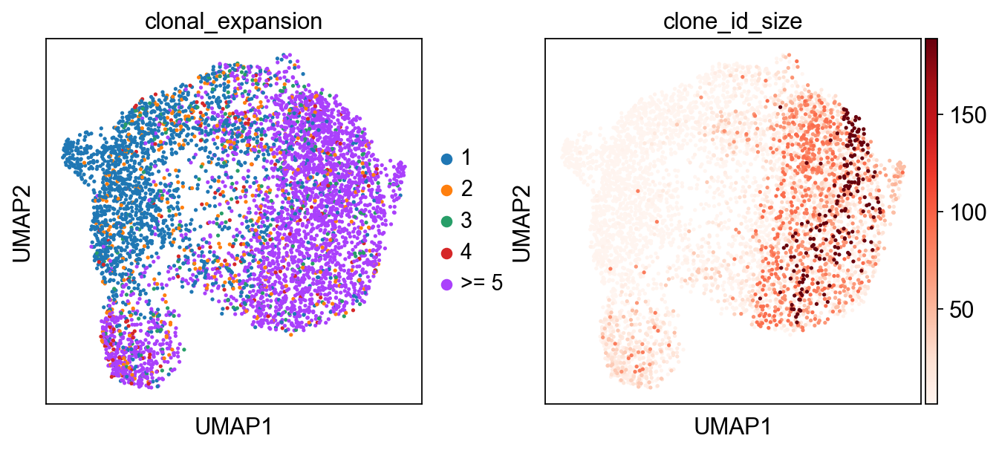

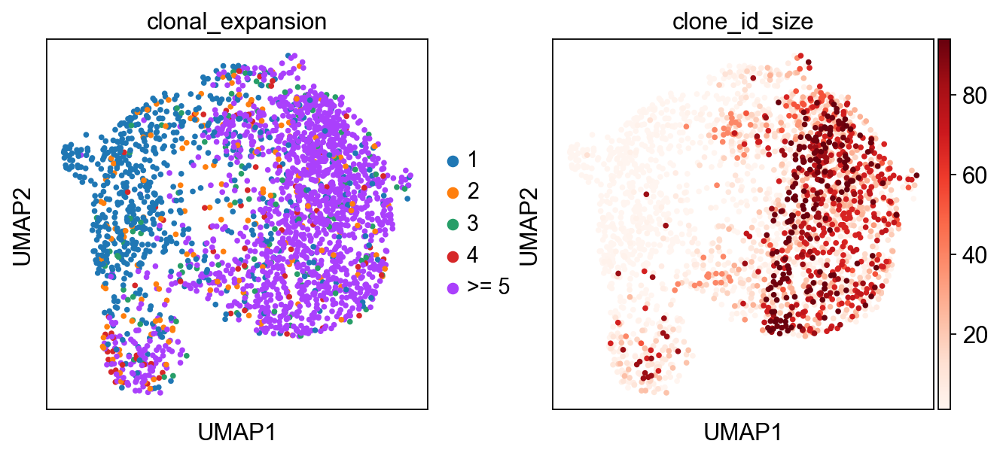

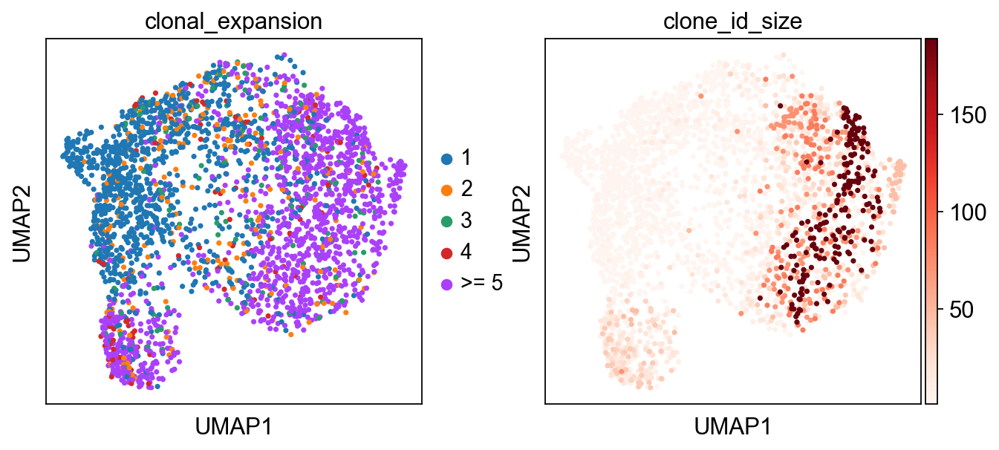

In [26]:
#sc.set_figure_params(figsize=(4, 4))
sc.set_figure_params(dpi=200, dpi_save=300)
sc.set_figure_params(figsize=(4, 4))
sc.pl.umap(adata, color=["clonal_expansion", "clone_id_size"], show=False, color_map='Reds')   

#plt.savefig(fig_dir+'Over_clonal_expansion_withoutremoving.pdf') 
#plt.savefig(fig_dir+'Over_clonal_expansion_noIR.pdf') 



sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2WT'], 
           color=["clonal_expansion", "clone_id_size"],show=False, color_map='Reds') 
#plt.savefig(fig_dir+'WT_clonal_expansion_withoutremoving.pdf')  
#plt.savefig(fig_dir+'WT_clonal_expansion_noIR.pdf')  

sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2KO'], show=False,
           color=["clonal_expansion", "clone_id_size"], color_map='Reds')   
#plt.savefig(fig_dir+'KO_clonal_expansion_withoutremoving.pdf')
#plt.savefig(fig_dir+'KO_clonal_expansion_noIR.pdf')


In [16]:
from typing import List

def clonal_expansion_interval(adata:sc.AnnData, interval:List, labels:List, inplace = True):
    category = pd.cut(adata.obs.clone_id_size.values, interval,
                      right=True, include_lowest=False, labels=labels)
    
    if inplace:
        adata.obs['clonal_expansion_cut'] = category
    
    
    
    

In [17]:
clonal_expansion_interval(adata, interval=[0,1,10, np.inf], labels=['1','2-9','>=10'])

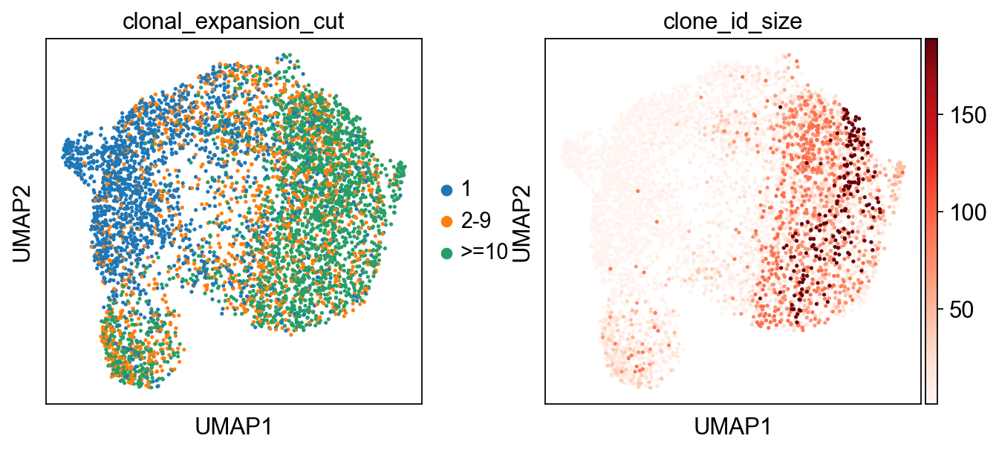

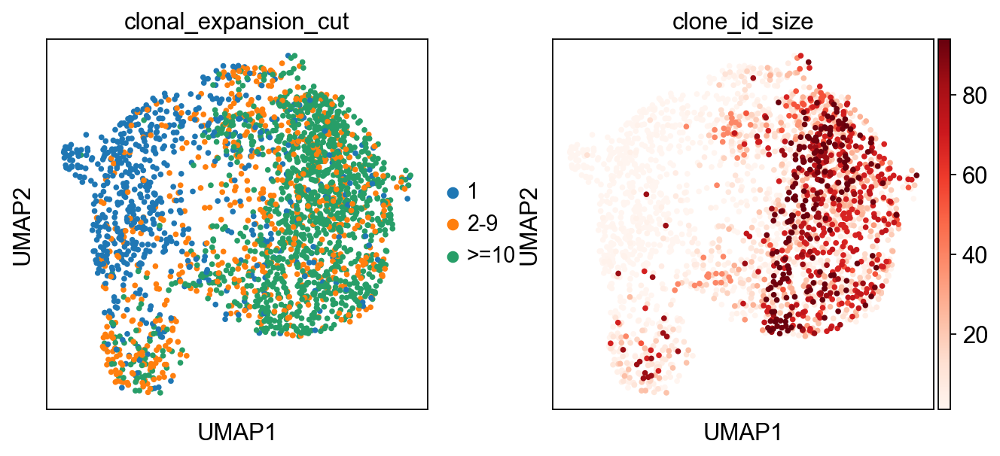

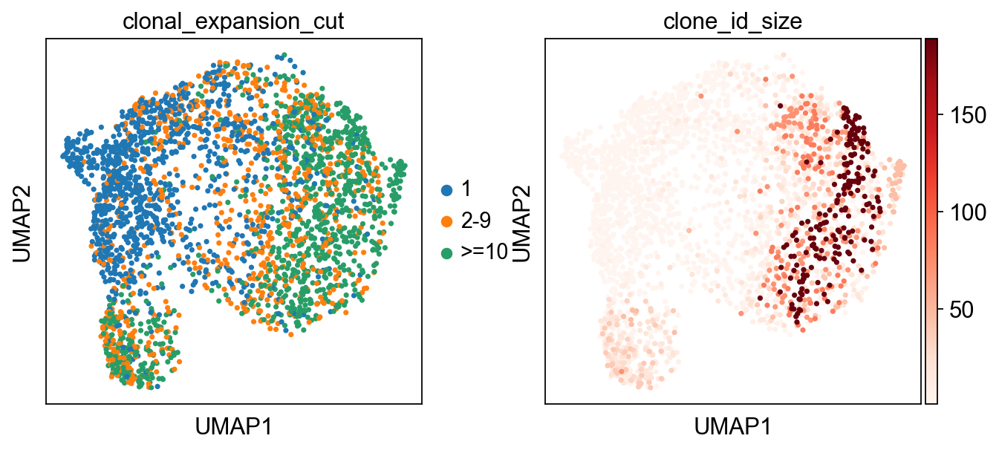

In [136]:
#sc.set_figure_params(figsize=(4, 4))
sc.set_figure_params(dpi=200, dpi_save=300)
sc.set_figure_params(figsize=(4, 4))
sc.pl.umap(adata, color=["clonal_expansion_cut", "clone_id_size"], show=False, color_map='Reds')   

#plt.savefig(fig_dir+'Over_clonal_expansion_withoutremoving.pdf') 
plt.savefig(fig_dir+'Over_clonal_expansion_noIR_10cut.pdf') 



sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2WT'], 
           color=["clonal_expansion_cut", "clone_id_size"],show=False, color_map='Reds') 
#plt.savefig(fig_dir+'WT_clonal_expansion_withoutremoving.pdf')  
plt.savefig(fig_dir+'WT_clonal_expansion_noIR_10cut.pdf')  

sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2KO'], show=False,
           color=["clonal_expansion_cut", "clone_id_size"], color_map='Reds')   
#plt.savefig(fig_dir+'KO_clonal_expansion_withoutremoving.pdf')
plt.savefig(fig_dir+'KO_clonal_expansion_noIR_10cut.pdf')


/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


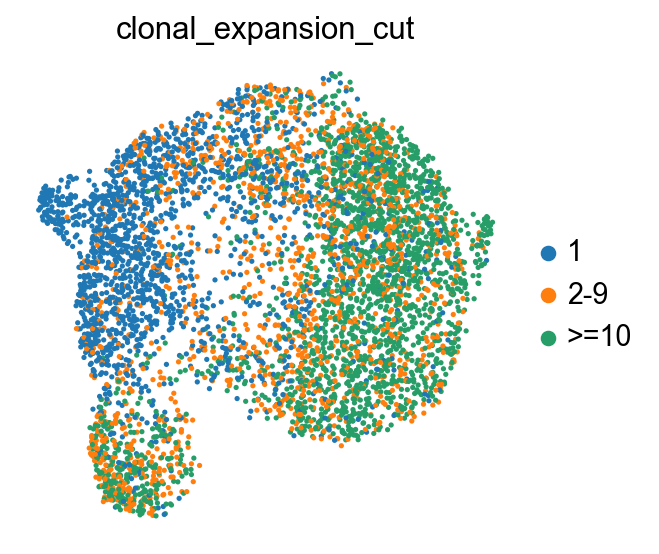

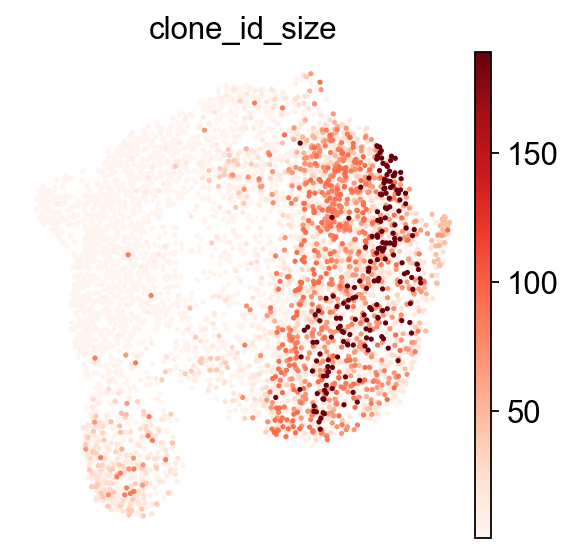

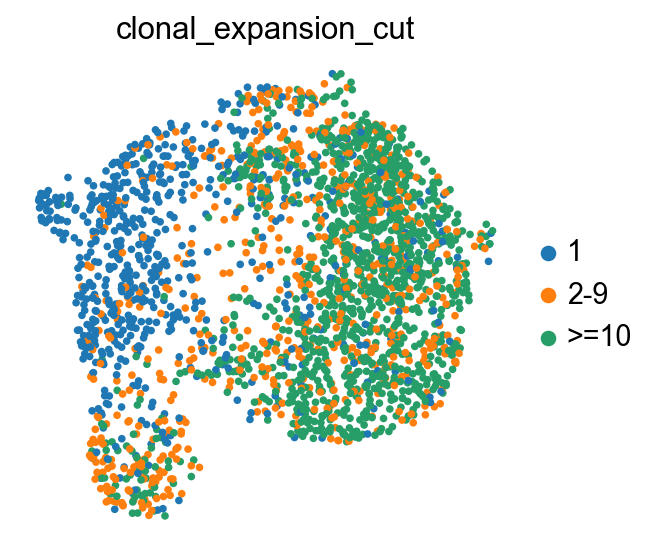

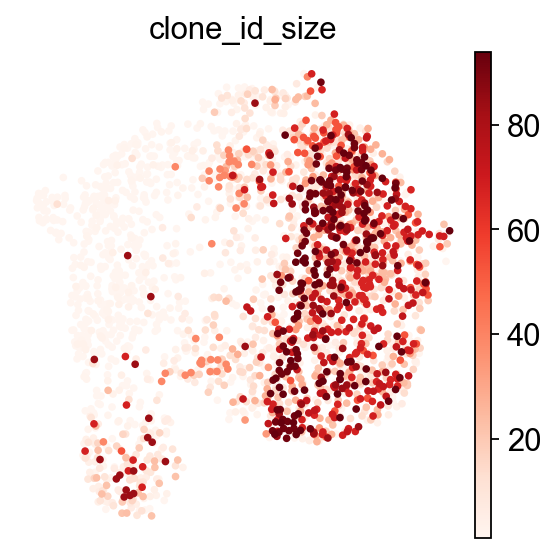

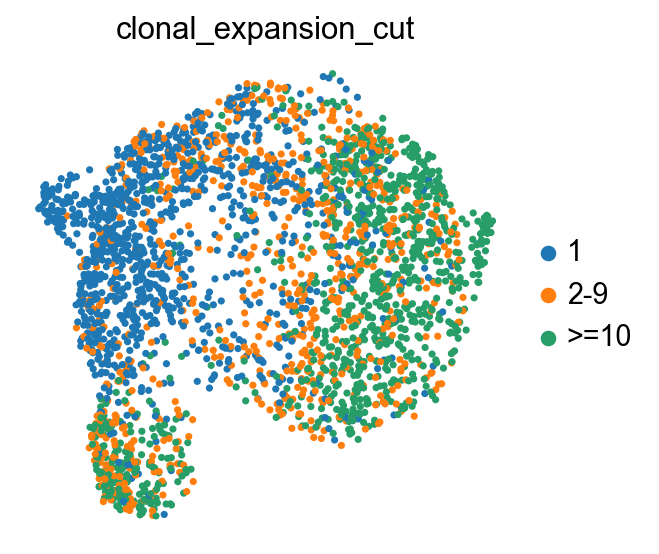

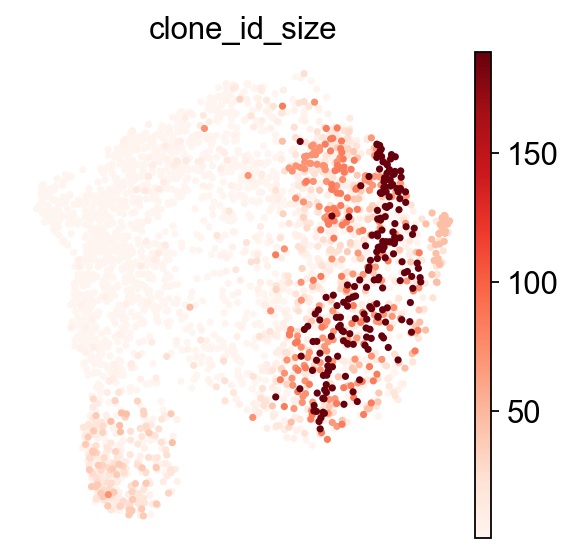

In [27]:
#sc.set_figure_params(figsize=(4, 4))
sc.set_figure_params(dpi=200, dpi_save=300,vector_friendly=True)
sc.set_figure_params(figsize=(4, 4))
## clonal expansion only
sc.pl.umap(adata, color=["clonal_expansion_cut"], show=False, frameon = False)   

#plt.savefig(fig_dir+'Over_clonal_expansion_withoutremoving.pdf') 
plt.savefig(fig_dir+'Over_clonal_expansion_only_noIR_10cut.pdf') 

## clone id
sc.pl.umap(adata, color=["clone_id_size"], show=False, color_map='Reds',frameon = False)   

#plt.savefig(fig_dir+'Over_clonal_expansion_withoutremoving.pdf') 
plt.savefig(fig_dir+'Over_clonal_id_only_noIR_10cut.pdf') 


### WT
## clonal expansion only
sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2WT'], 
           color=["clonal_expansion_cut"],show=False, color_map='Reds',frameon = False) 
#plt.savefig(fig_dir+'WT_clonal_expansion_withoutremoving.pdf')  
plt.savefig(fig_dir+'WT_clonal_expansion_only_noIR_10cut.pdf')  

## clone id
sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2WT'], 
           color=["clone_id_size"],show=False, color_map='Reds',frameon = False) 
#plt.savefig(fig_dir+'WT_clonal_expansion_withoutremoving.pdf')  
plt.savefig(fig_dir+'WT_clonal_id_only_noIR_10cut.pdf')  


### KO
## clonal expansion only
sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2KO'], show=False,
           color=["clonal_expansion_cut"], color_map='Reds',frameon = False)   
#plt.savefig(fig_dir+'KO_clonal_expansion_withoutremoving.pdf')
plt.savefig(fig_dir+'KO_clonal_expansion_only_noIR_10cut.pdf')

## clone id onyl
sc.pl.umap(adata[adata.obs["Group"] == 'Srebf2KO'], show=False,
           color=["clone_id_size"], color_map='Reds',frameon = False)   
#plt.savefig(fig_dir+'KO_clonal_expansion_withoutremoving.pdf')
plt.savefig(fig_dir+'KO_clonal_id_only_noIR_10cut.pdf')


/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


<AxesSubplot: title={'center': 'clonal_expansion_cut'}, xlabel='UMAP1', ylabel='UMAP2'>

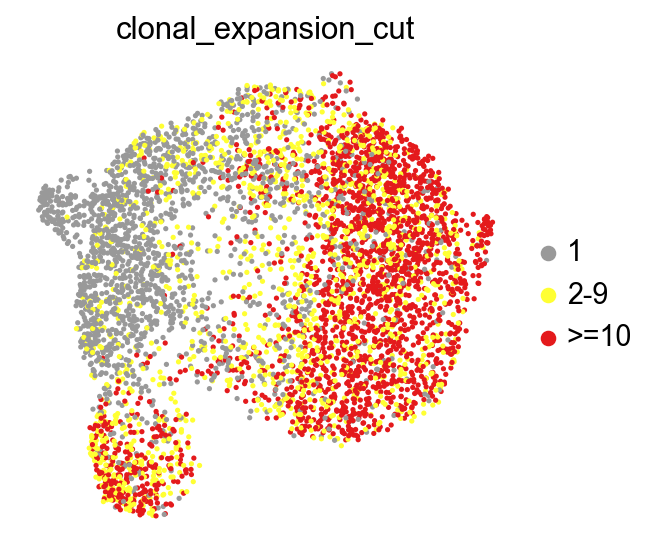

In [57]:
color_panel = ['#999999', '#FFFF33','#E41A1C']


sc.pl.umap(adata, color=["clonal_expansion_cut"], show=False, palette=color_panel, frameon = False)
plt.savefig(fig_dir+'KO_clonal_id_only_noIR_10cut.pdf')

In [47]:
cmap = plt.get_cmap(mpl_cm.Set1)
cmap.reversed

<bound method ListedColormap.reversed of <matplotlib.colors.ListedColormap object at 0x28811f670>>

<AxesSubplot:>

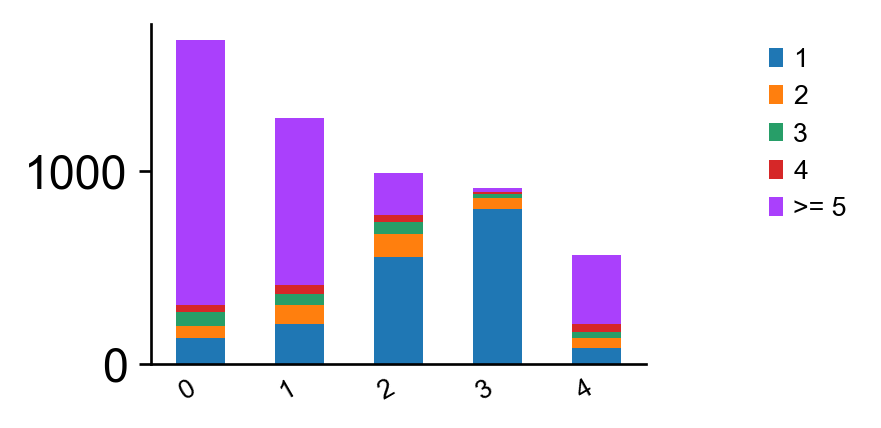

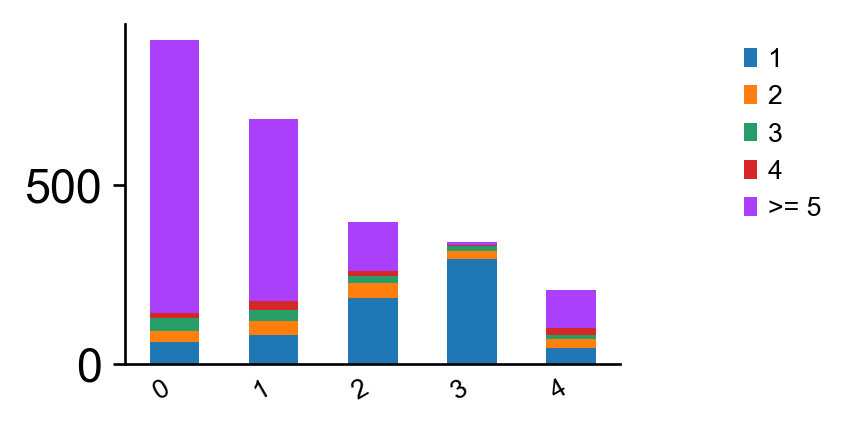

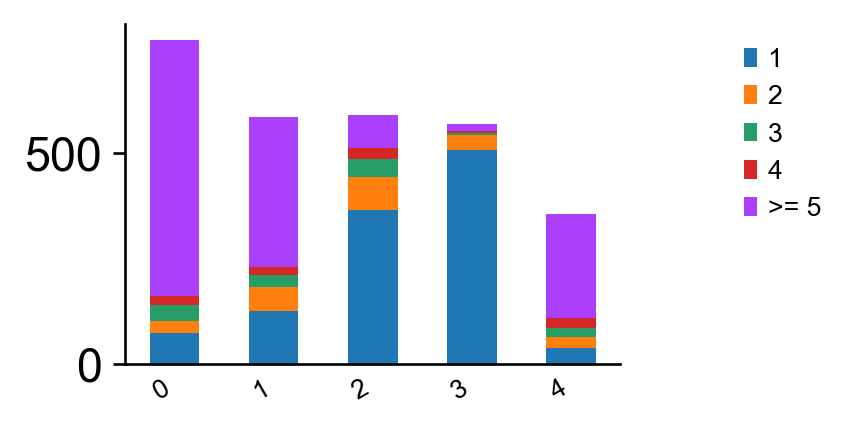

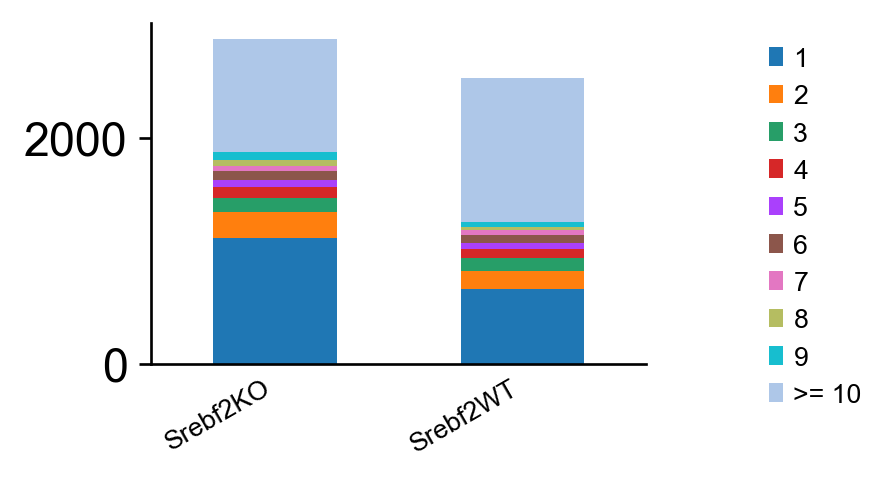

In [30]:
ir.pl.clonal_expansion(adata, groupby="seurat_clusters", clip_at=5, normalize=False)

## WT
ir.pl.clonal_expansion(adata[adata.obs["Group"] == 'Srebf2WT'], 
                       groupby="seurat_clusters", clip_at=5, normalize=False)

## KO
ir.pl.clonal_expansion(adata[adata.obs["Group"] == 'Srebf2KO'], 
                       groupby="seurat_clusters", clip_at=5, normalize=False)

## Overall distribution
ir.pl.clonal_expansion(adata, 
                       groupby="Group", clip_at=10, normalize=False)


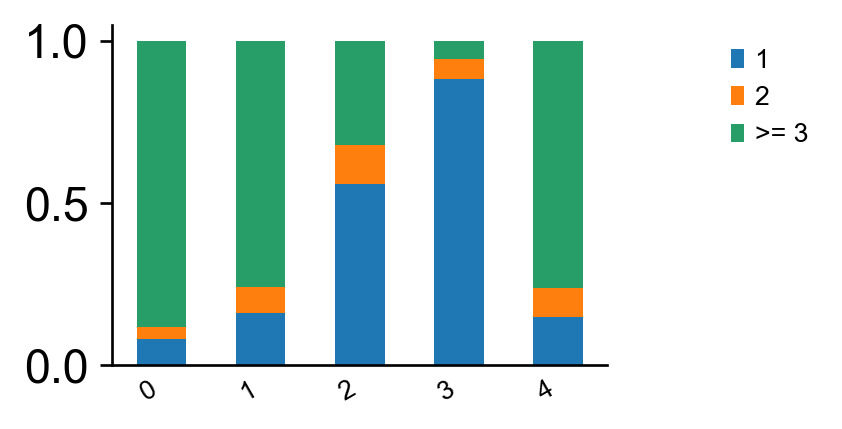

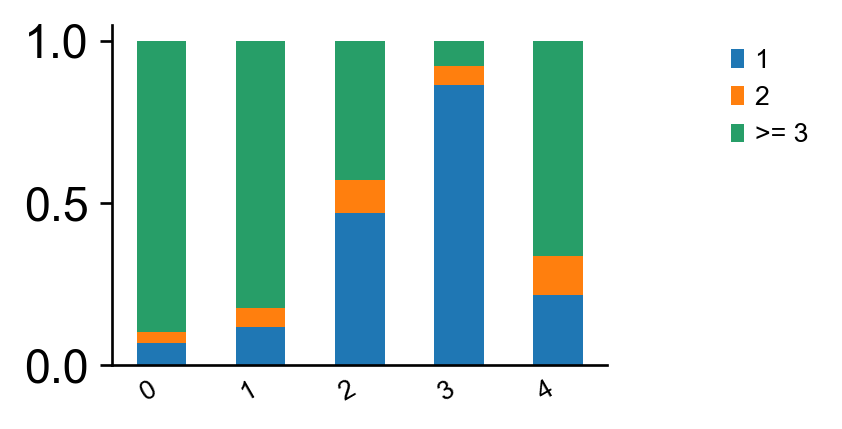

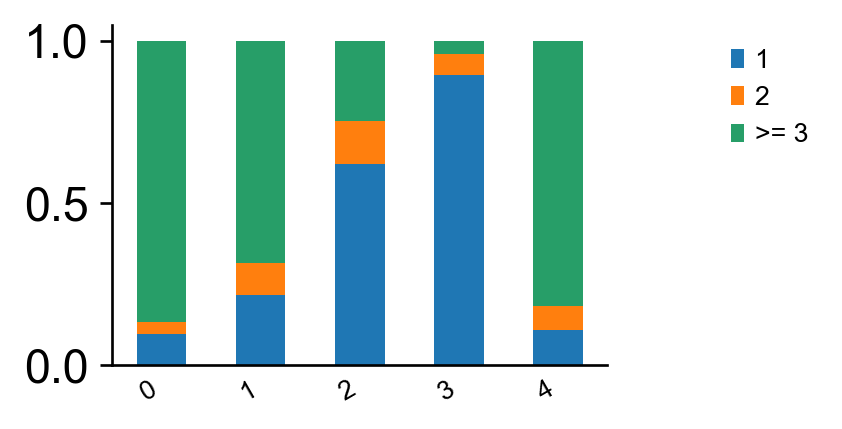

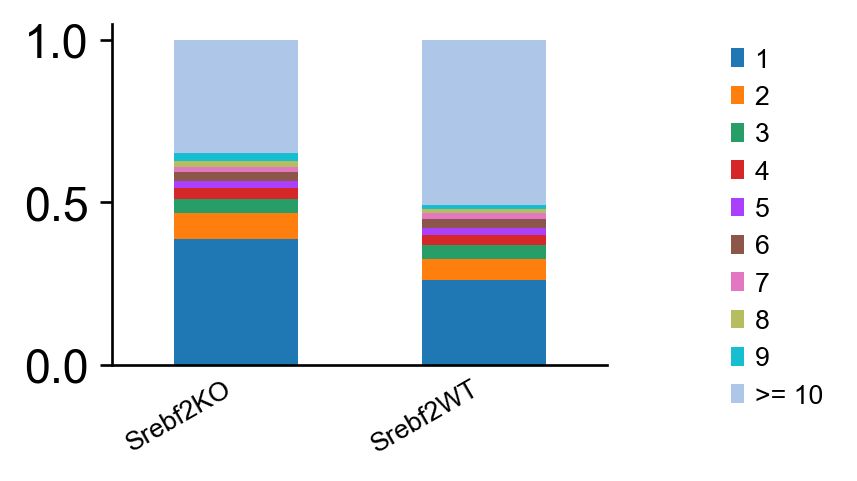

In [139]:
ir.pl.clonal_expansion(adata, "seurat_clusters")
plt.savefig(fig_dir+'clonal_expansion_distribution_normalized_overall_3cut.pdf', bbox_inches='tight')

## WT
ir.pl.clonal_expansion(adata[adata.obs["Group"] == 'Srebf2WT'], "seurat_clusters")
plt.savefig(fig_dir+'clonal_expansion_distribution_normalized_WT_3cut.pdf', bbox_inches='tight')

## KO
ir.pl.clonal_expansion(adata[adata.obs["Group"] == 'Srebf2KO'], "seurat_clusters")
plt.savefig(fig_dir+'clonal_expansion_distribution_normalized_KO_3cut.pdf', bbox_inches='tight')

## Overall distribution
ir.pl.clonal_expansion(adata, "Group",clip_at=10)
plt.savefig(fig_dir+'clonal_expansion_distribution_normalized_overall.pdf', bbox_inches='tight')



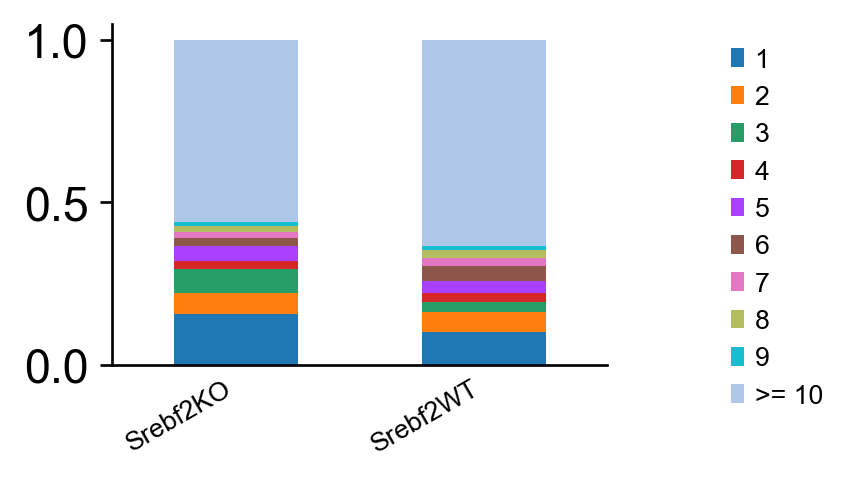

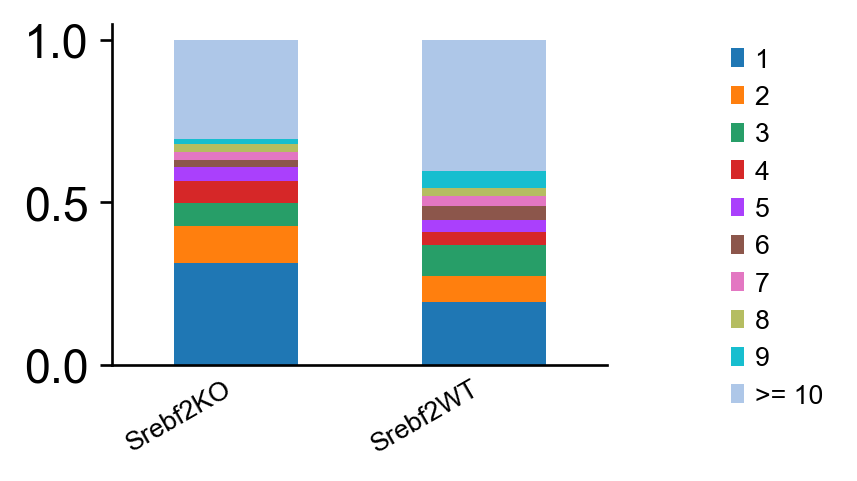

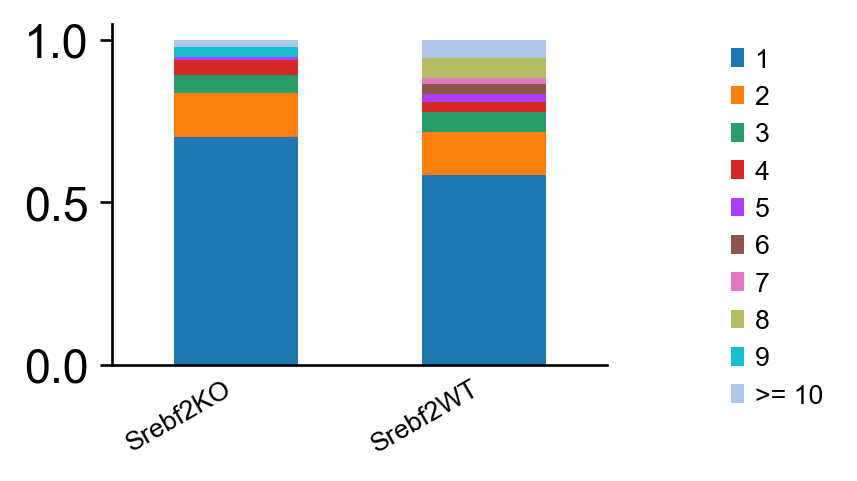

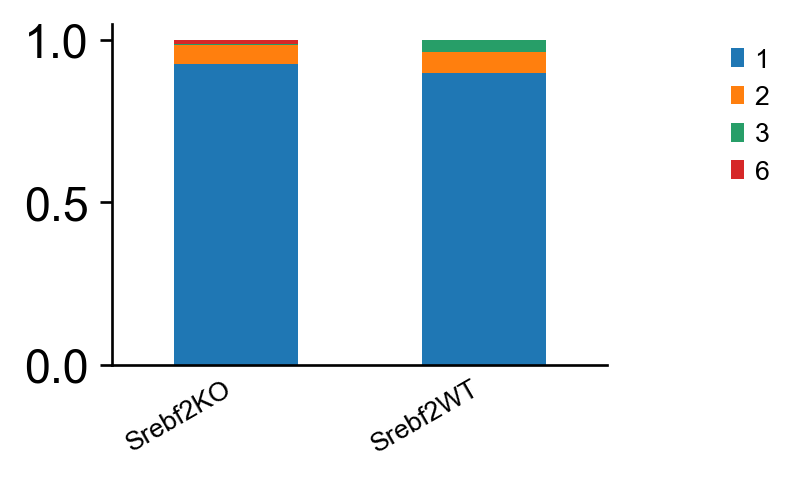

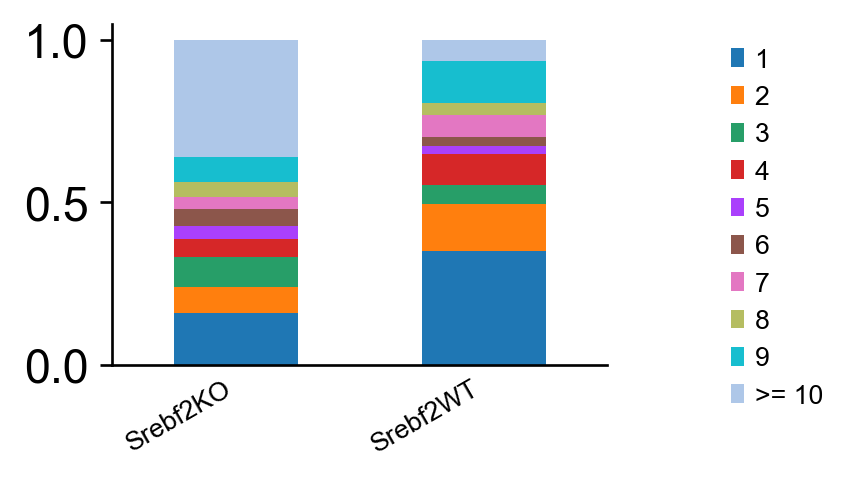

In [42]:
#sc.set_figure_params(figsize=(4, 5))
## Cluster 0
ir.pl.clonal_expansion(adata[adata.obs["seurat_clusters"] == '0'], "Group",clip_at=10)
#plt.tight_layout()
plt.savefig(fig_dir+'clonal_expansion_distribution_cluster0.pdf', bbox_inches='tight')

## Cluster 1
ir.pl.clonal_expansion(adata[adata.obs["seurat_clusters"] == '1'], "Group",clip_at=10)
#plt.tight_layout()
plt.savefig(fig_dir+'clonal_expansion_distribution_cluster1.pdf',bbox_inches='tight')


## Cluster 2
ir.pl.clonal_expansion(adata[adata.obs["seurat_clusters"] == '2'], "Group",clip_at=10)
#plt.tight_layout()
plt.savefig(fig_dir+ 'clonal_expansion_distribution_cluster2.pdf',bbox_inches='tight')


## Cluster 3
ir.pl.clonal_expansion(adata[adata.obs["seurat_clusters"] == '3'], "Group",clip_at=10)
#plt.tight_layout()
plt.savefig(fig_dir+ 'clonal_expansion_distribution_cluster3.pdf',bbox_inches='tight')


## Cluster 4
ir.pl.clonal_expansion(adata[adata.obs["seurat_clusters"] == '4'], "Group",clip_at=10)
#plt.tight_layout()
plt.savefig(fig_dir+ 'clonal_expansion_distribution_cluster4.pdf',bbox_inches='tight')


In [47]:
ir.tl.summarize_clonal_expansion(adata, groupby='Group')

clone_id_clipped_count,1,2,>= 3
Group,,,
Srebf2KO,1112.0,230.0,1533.0
Srebf2WT,665.0,158.0,1713.0


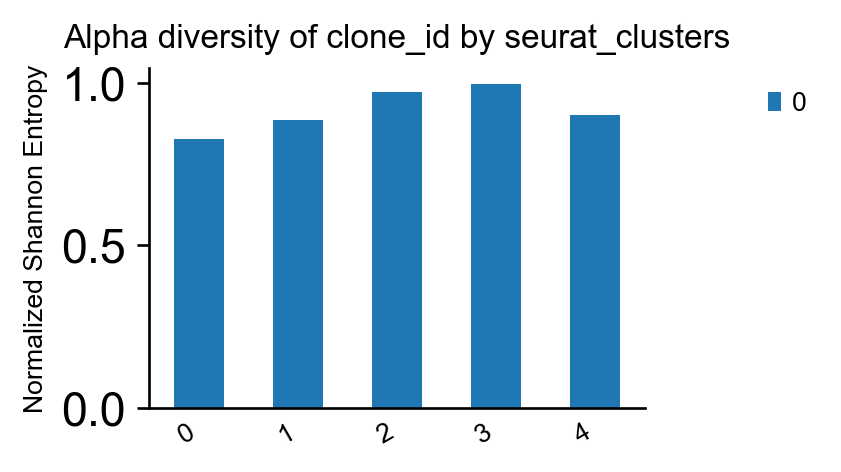

In [33]:
ax = ir.pl.alpha_diversity(
    adata, metric="normalized_shannon_entropy", groupby="seurat_clusters"
)

<AxesSubplot:title={'center':'Number of cells in clone_id by seurat_clusters'}, xlabel='clone_id', ylabel='Number of cells'>

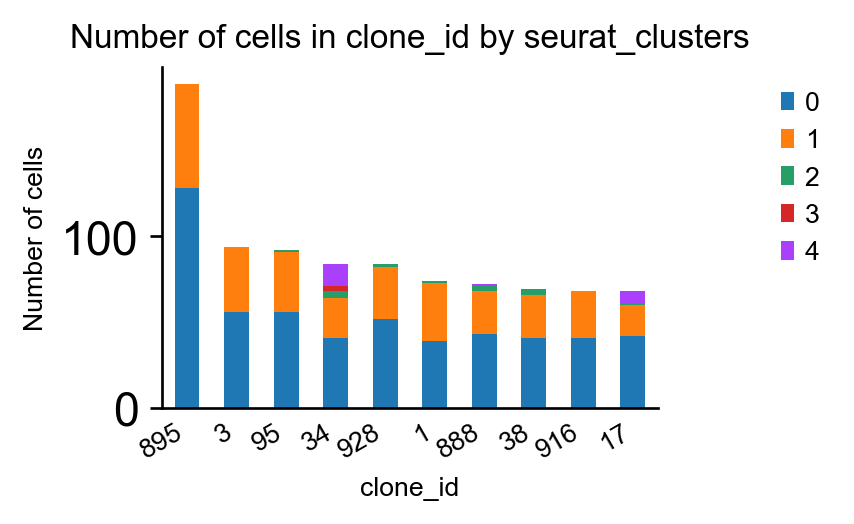

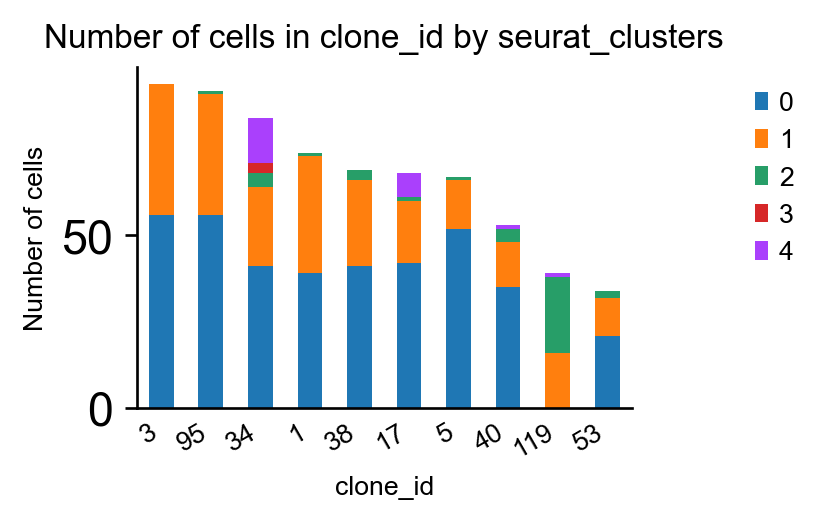

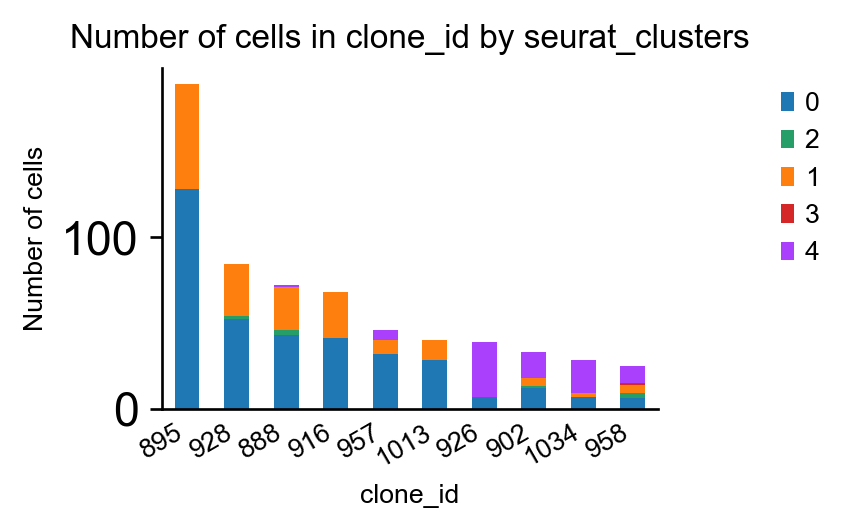

In [43]:
ir.pl.group_abundance(adata, groupby="clone_id", 
                      target_col="seurat_clusters", max_cols=10)

## WT
ir.pl.group_abundance(adata[adata.obs["Group"] == 'Srebf2WT'], groupby="clone_id", 
                      target_col="seurat_clusters", max_cols=10)

## KO
ir.pl.group_abundance(adata[adata.obs["Group"] == 'Srebf2KO'], groupby="clone_id", 
                      target_col="seurat_clusters", max_cols=10)

In [ ]:
adata.obs.loc[adata.obs["clone_id"] == "907",
    [
        "IR_VJ_1_junction_aa",
        "IR_VJ_2_junction_aa",
        "IR_VDJ_1_junction_aa",
        "IR_VDJ_2_junction_aa",
        "receptor_subtype",
    ]]


,IR_VJ_1_junction_aa,IR_VJ_2_junction_aa,IR_VDJ_1_junction_aa,IR_VDJ_2_junction_aa,receptor_subtype
AAACGGGGTCACTTCC-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
AAAGATGTCGTATCAG-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
AAAGTAGCAATAGCGG-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
AAAGTAGGTTACCAGT-1,CAVASSGSWQLIF,NaN,CASSQAKTGRTETLYF,NaN,TRA+TRB
AACGTTGGTGGGTCAA-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
...,...,...,...,...,...
TTGGCAAGTTATGCGT-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
TTTATGCGTATCTGCA-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
TTTGCGCAGATATACG-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB
TTTGCGCAGATTACCC-1,CAVASSGSWQLIF,CALRGVNNNNAPRF,CASSQAKTGRTETLYF,NaN,TRA+TRB


In [ ]:
clone_907 = adata[adata.obs["clone_id"] == "907"]

In [ ]:
clone_907

View of AnnData object with n_obs × n_vars = 202 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'percent.mt', 'percent.rb', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'Group', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ

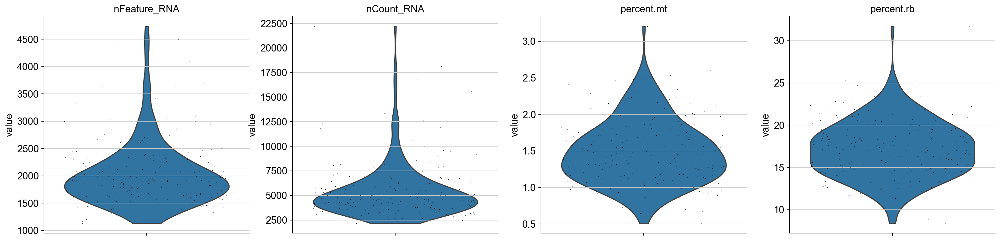

In [ ]:
sc.pl.violin(clone_907, ['nFeature_RNA', 'nCount_RNA', 'percent.mt', 'percent.rb'],
             jitter=0.4, multi_panel=True, show=False)

plt.savefig(fig_dir+'clone_907_QC.pdf')

In [ ]:
sc.pl.umap(adata, )

<AxesSubplot:title={'center':'Fraction of seurat_clusters in each clone_id'}, xlabel='clone_id', ylabel='Fraction of cells in Group'>

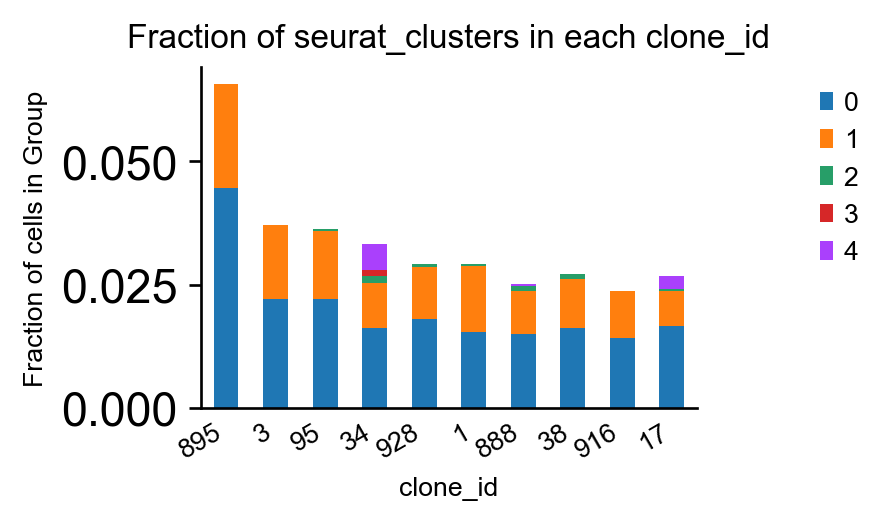

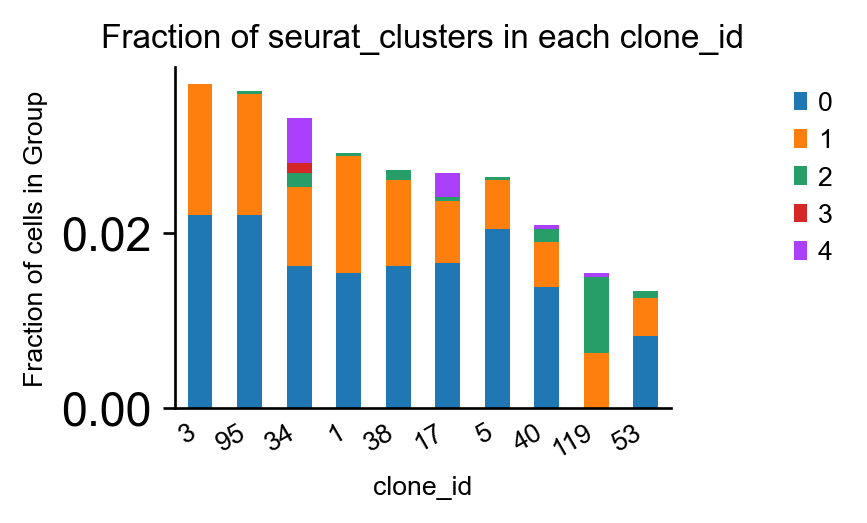

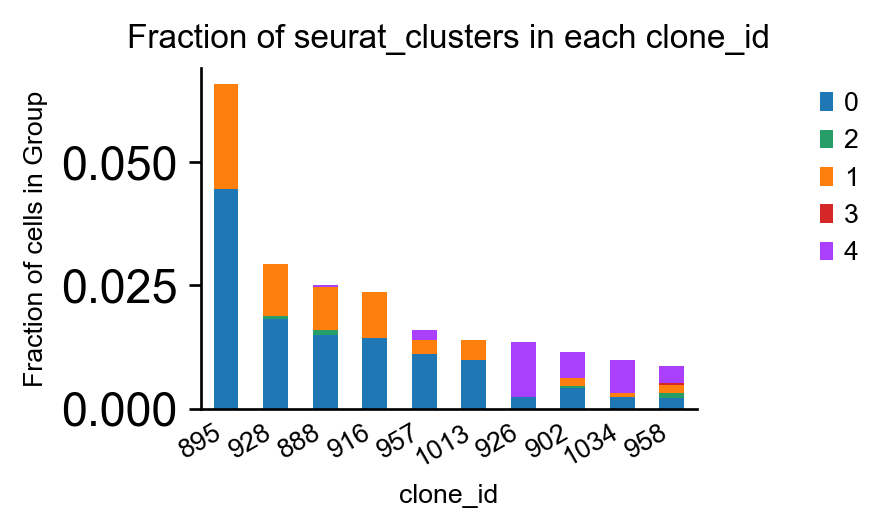

In [45]:
ir.pl.group_abundance(
    adata, groupby="clone_id", target_col="seurat_clusters", 
    max_cols=10, normalize="Group"
)

## WT
ir.pl.group_abundance(
    adata[adata.obs["Group"] == 'Srebf2WT'], groupby="clone_id", target_col="seurat_clusters", 
    max_cols=10, normalize="Group"
)

## KO
ir.pl.group_abundance(
    adata[adata.obs["Group"] == 'Srebf2KO'], groupby="clone_id", target_col="seurat_clusters", 
    max_cols=10, normalize="Group"
)

In [ ]:
sc.pl.umap(adata, color='clone1001')

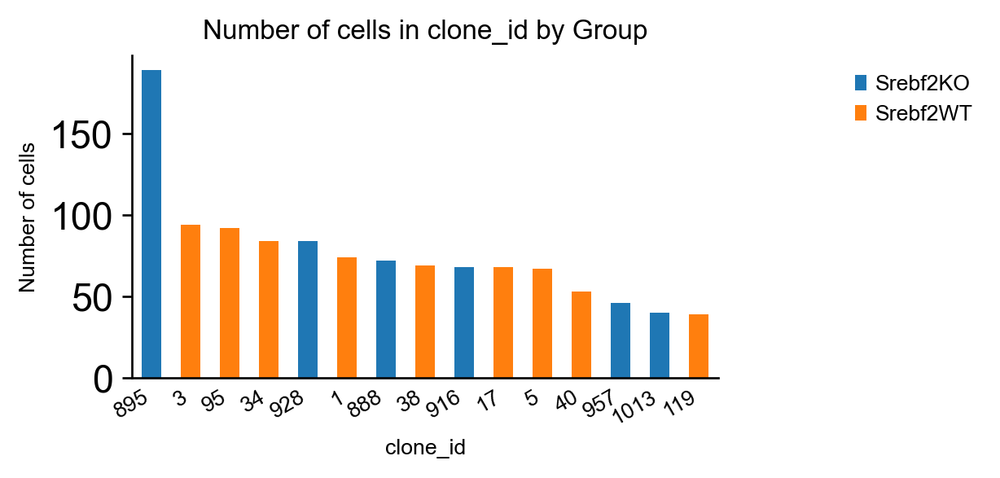

In [46]:
ax = ir.pl.group_abundance(
    adata, groupby="clone_id", target_col="Group", max_cols=15, figsize=(5, 3)
)

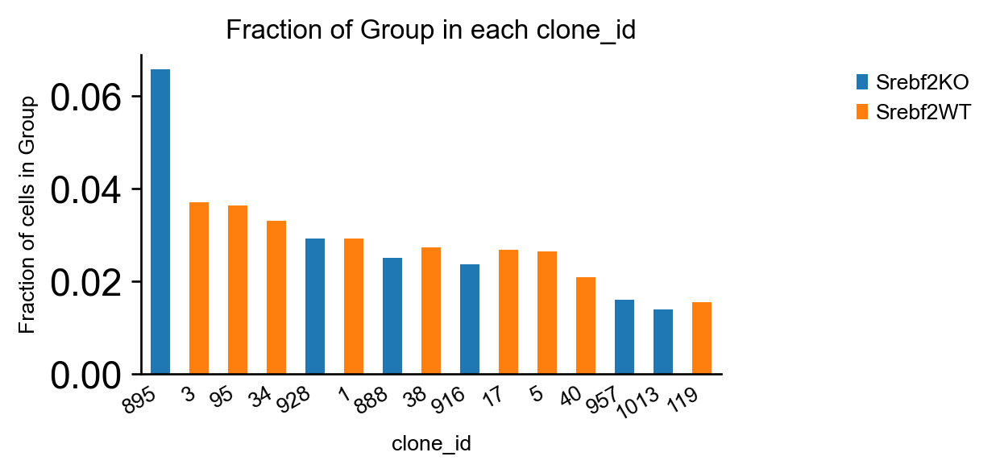

In [138]:
ax = ir.pl.group_abundance(
    adata, groupby="clone_id", target_col="Group", 
    max_cols=15, figsize=(5, 3), normalize='Group'
)

/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


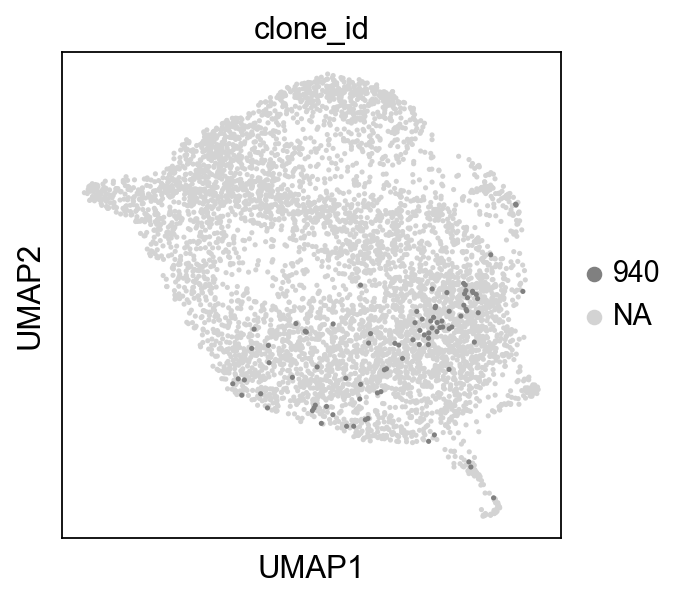

In [ ]:
sc.pl.umap(
    adata,
    color="clone_id",
    groups='940',
    #ax=ax2,
    # increase size of highlighted dots
    
    #palette=cycler(color=mpl_cm.Dark2_r.colors),
)


In [ ]:
adata.uns_keys()

['Group_colors',
 'clonal_expansion_colors',
 'clonal_expansion_cut_colors',
 'clone_id',
 'clone_id_colors',
 'ir_dist_aa_alignment',
 'ir_dist_nt_identity',
 'receptor_subtype_colors',
 'seurat_clusters_colors',
 'umap_density_Group_params']

In [ ]:
sc.tl.umap(adata)
sc.tl.embedding_density(adata, basis='umap', groupby='Group')
sc.pl.embedding_density(
    adata, basis='umap', key='umap_density_phase', group='Srebf2KO'
)

In [ ]:
adata.obs_keys()

['nCount_RNA',
 'nFeature_RNA',
 'nCount_HTO',
 'nFeature_HTO',
 'percent.mt',
 'HTO_maxID',
 'HTO_secondID',
 'HTO_margin',
 'HTO_classification',
 'hash.ID',
 'Group',
 'RNA_snn_res.0.5',
 'seurat_clusters',
 'RNA_snn_res.0.4',
 'RNA_snn_res.0.3',
 'RNA_snn_res.0.2',
 'is_cell',
 'high_confidence',
 'multi_chain',
 'extra_chains',
 'IR_VJ_1_c_call',
 'IR_VJ_2_c_call',
 'IR_VDJ_1_c_call',
 'IR_VDJ_2_c_call',
 'IR_VJ_1_consensus_count',
 'IR_VJ_2_consensus_count',
 'IR_VDJ_1_consensus_count',
 'IR_VDJ_2_consensus_count',
 'IR_VJ_1_d_call',
 'IR_VJ_2_d_call',
 'IR_VDJ_1_d_call',
 'IR_VDJ_2_d_call',
 'IR_VJ_1_duplicate_count',
 'IR_VJ_2_duplicate_count',
 'IR_VDJ_1_duplicate_count',
 'IR_VDJ_2_duplicate_count',
 'IR_VJ_1_j_call',
 'IR_VJ_2_j_call',
 'IR_VDJ_1_j_call',
 'IR_VDJ_2_j_call',
 'IR_VJ_1_junction',
 'IR_VJ_2_junction',
 'IR_VDJ_1_junction',
 'IR_VDJ_2_junction',
 'IR_VJ_1_junction_aa',
 'IR_VJ_2_junction_aa',
 'IR_VDJ_1_junction_aa',
 'IR_VDJ_2_junction_aa',
 'IR_VJ_1_locus',
 

In [ ]:
adata.obs.groupby(["seurat_clusters", "clonal_expansion"]).apply(len).to_csv(fig_dir+'cluster_clonal_expansion_count.csv')

## Comparing repertoires

In [48]:
df, dst, lk = ir.tl.repertoire_overlap(adata, "Group", inplace=False)
df.head()

clone_id,0,1,2,3,4,5,6,7,8,9,...,2249,2250,2251,2252,2253,2254,2255,2256,2257,2258
Group,,,,,,,,,,,,,,,,,,,,,
Srebf2KO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Srebf2WT,1.0,74.0,1.0,94.0,1.0,67.0,24.0,1.0,2.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


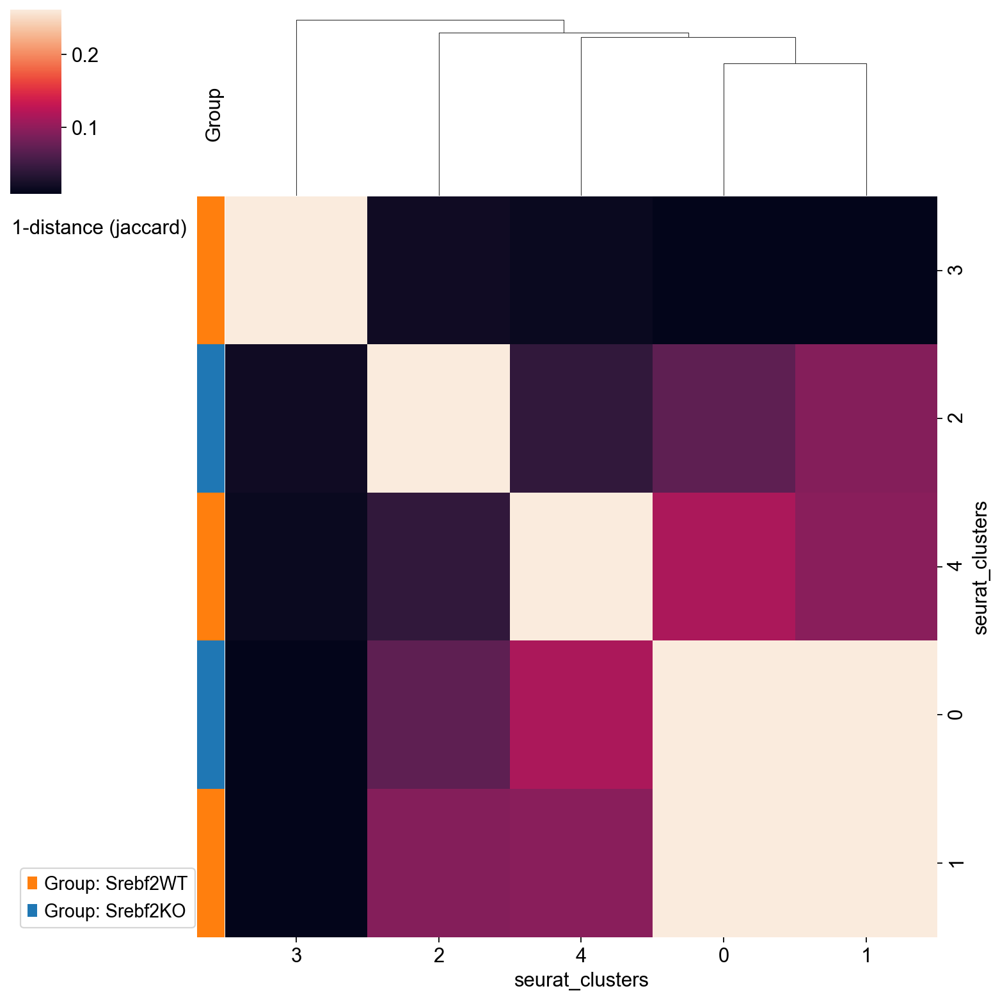

In [112]:
ir.pl.repertoire_overlap(adata, groupby="seurat_clusters", heatmap_cats=['Group'])

## Clonotype modularity

In [61]:
freq, stat = ir.tl.clonotype_imbalance(
    adata,
    replicate_col="Group",
    groupby="seurat_clusters",
    case_label="4",
    control_label="0",
    inplace=False,
)
top_differential_clonotypes = stat["clone_id"].tolist()[:3]


/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scirpy/io/_util.py:71: FutureWarning: clonotype_imbalance is a deprecated function and will be removed in a future version of scirpy. Consider using `tl.clonotype_modularity` instead. If `clonotype_modularity` does not cover your use-case, please create an issue on GitHub to let us know such that we can take it into account! (https://github.com/scverse/scirpy/issues)
  return f(*args, **kwargs)


In [62]:
top_differential_clonotypes

['895', '3', '95']

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={"wspace": 0.6})
sc.pl.umap(adata, color="seurat_clusters", ax=ax1, show=False)
sc.pl.umap(
    adata,
    color="clone_id",
    groups=top_differential_clonotypes,
    ax=ax2,
    # increase size of highlighted dots
    size=[
        80 if c in top_differential_clonotypes else 30 for c in adata.obs["clone_id"]
    ],
    palette=cycler(color=mpl_cm.Dark2_r.colors),
)

## TCR overlap

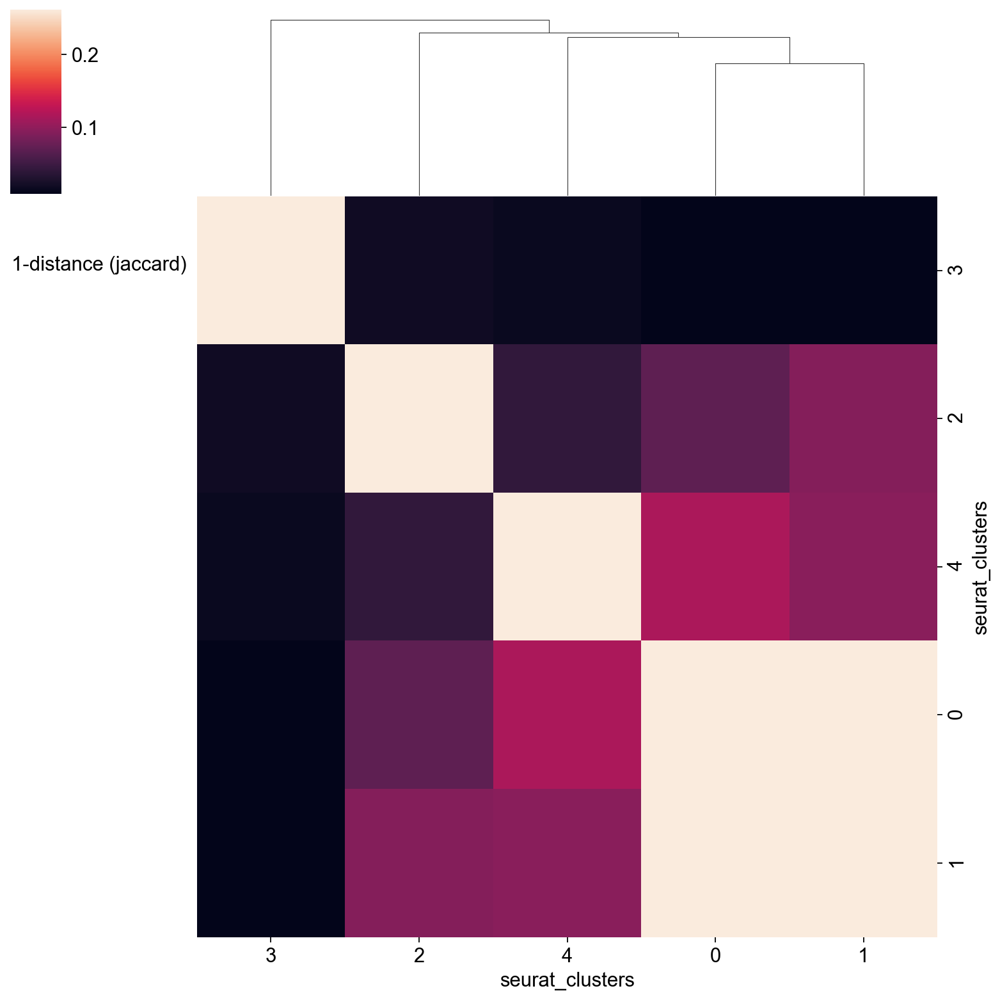

In [113]:
ir.tl.repertoire_overlap(adata, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata, groupby='Group', target_col="seurat_clusters", fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_overall_heatmap.pdf', bbox_inches='tight')


In [91]:
adata_ko = adata[adata.obs["Group"] == 'Srebf2KO']

adata_wt = adata[adata.obs["Group"] == 'Srebf2WT']

In [95]:
adata_wt

View of AnnData object with n_obs × n_vars = 2536 × 32285
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'percent.mt', 'percent.rb', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'Group', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.2', 'RNA_snn_res.0.25', 'RNA_snn_res.0.35', 'RNA_snn_res.0.38', 'RNA_snn_res.0.36', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 

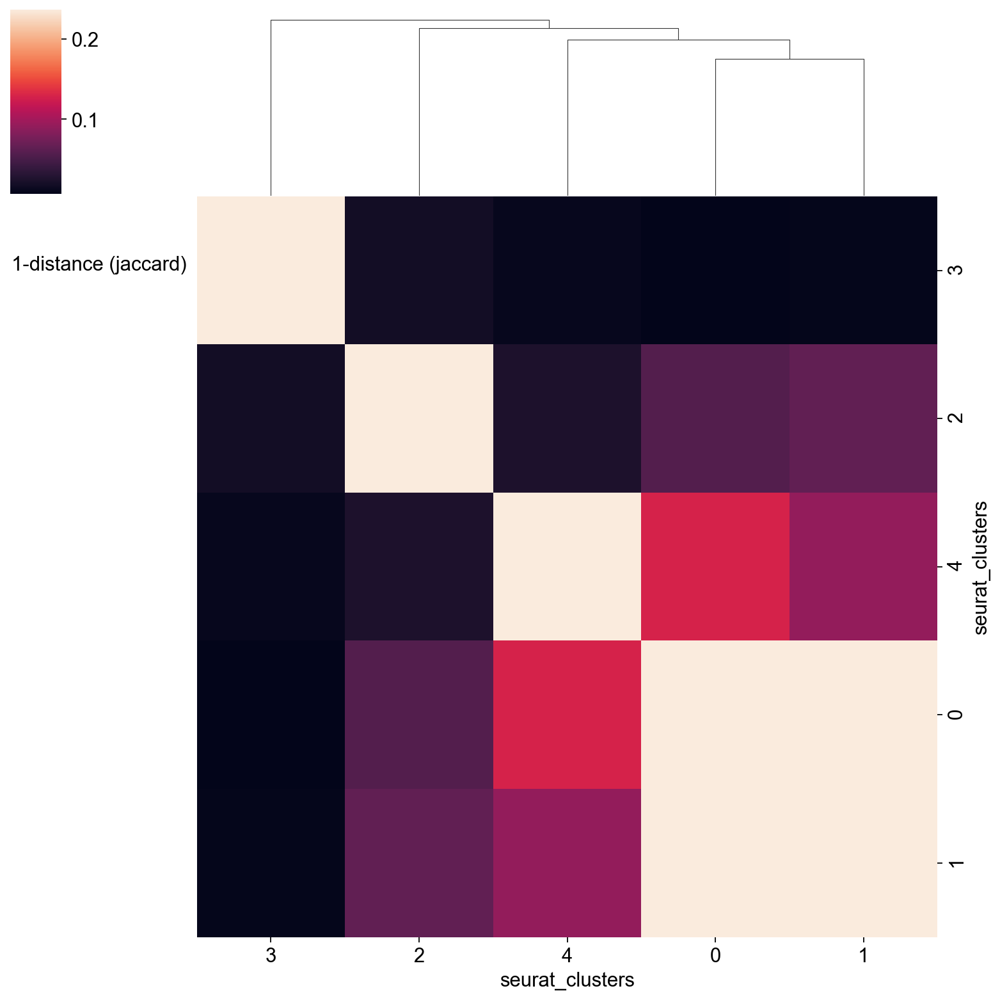

In [114]:
## WT

ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, groupby='seurat_clusters',  target_col="clone_id", fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_KO_heatmap.pdf', bbox_inches='tight')


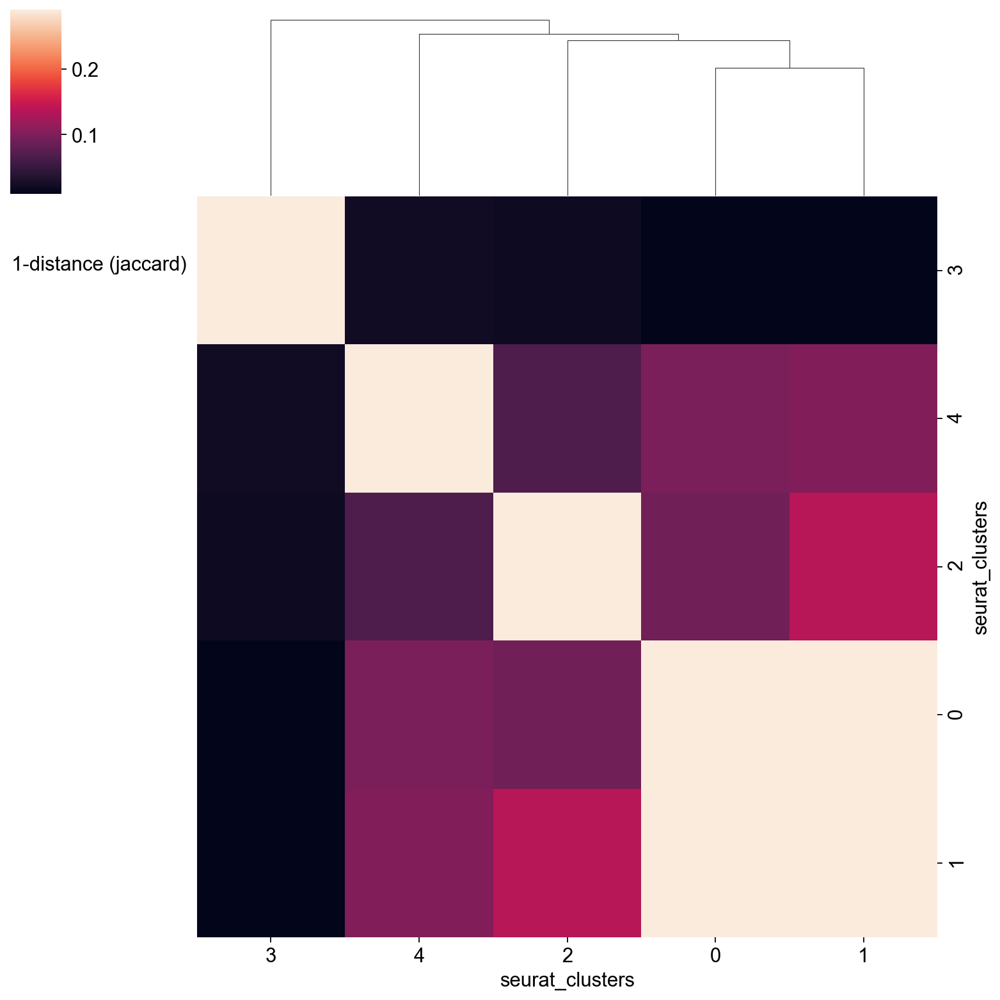

In [115]:
## KO

ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, groupby='seurat_clusters',  target_col="seurat_clusters", fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_WT_heatmap.pdf', bbox_inches='tight')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


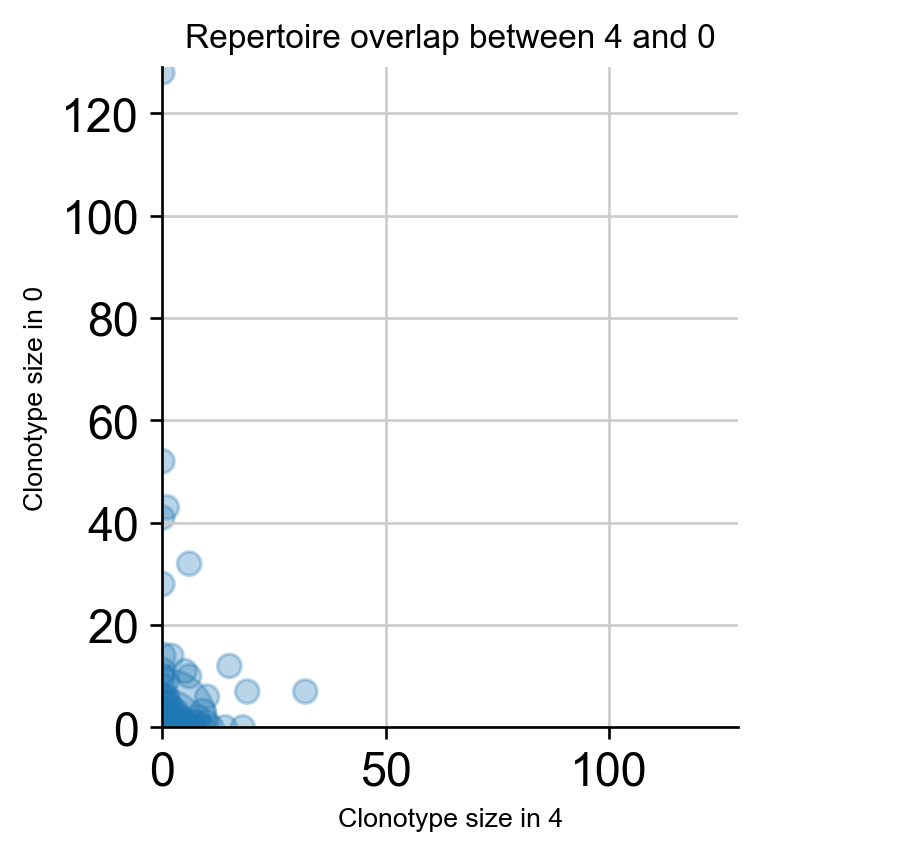

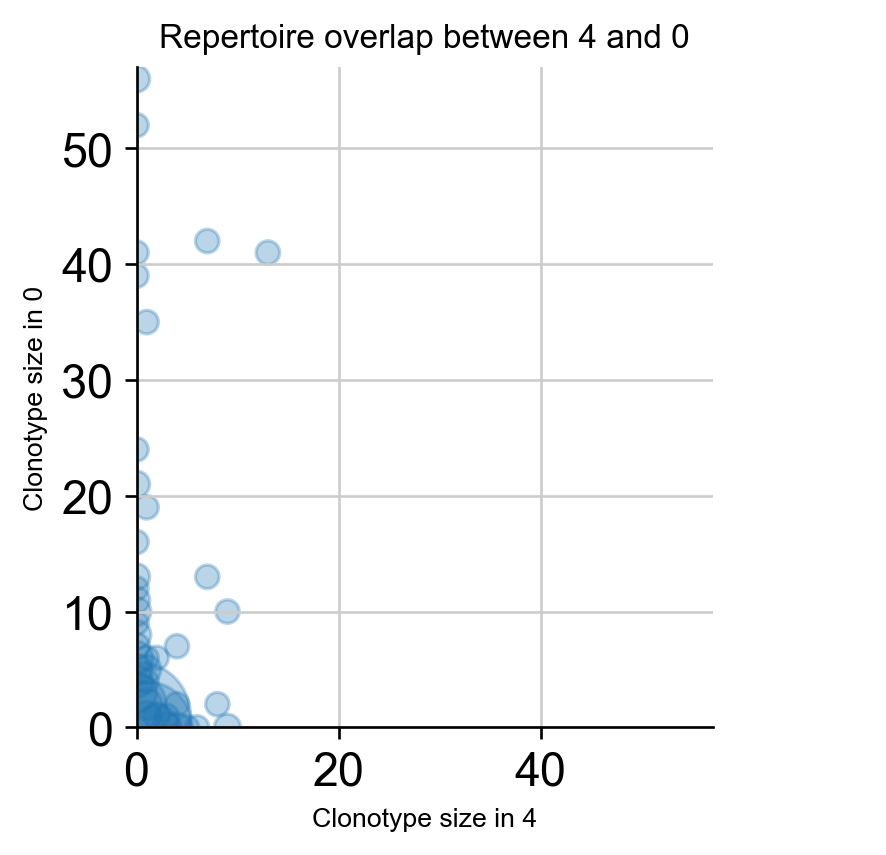

In [116]:
##Repertoire overlap between cluster 4 and cluster 0
### KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["4", "0"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_0_KO.pdf', bbox_inches='tight')


#ir.pl.repertoire_overlap(
    #adata[adata.obs["Group"] == 'Srebf2WT'], "seurat_clusters", pair_to_plot=["4", "0"], fig_kws={"dpi": 120}
#)

##Repertoire overlap between cluster 4 and cluster 0
### WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["4", "0"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_0_WT.pdf', bbox_inches='tight')




No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


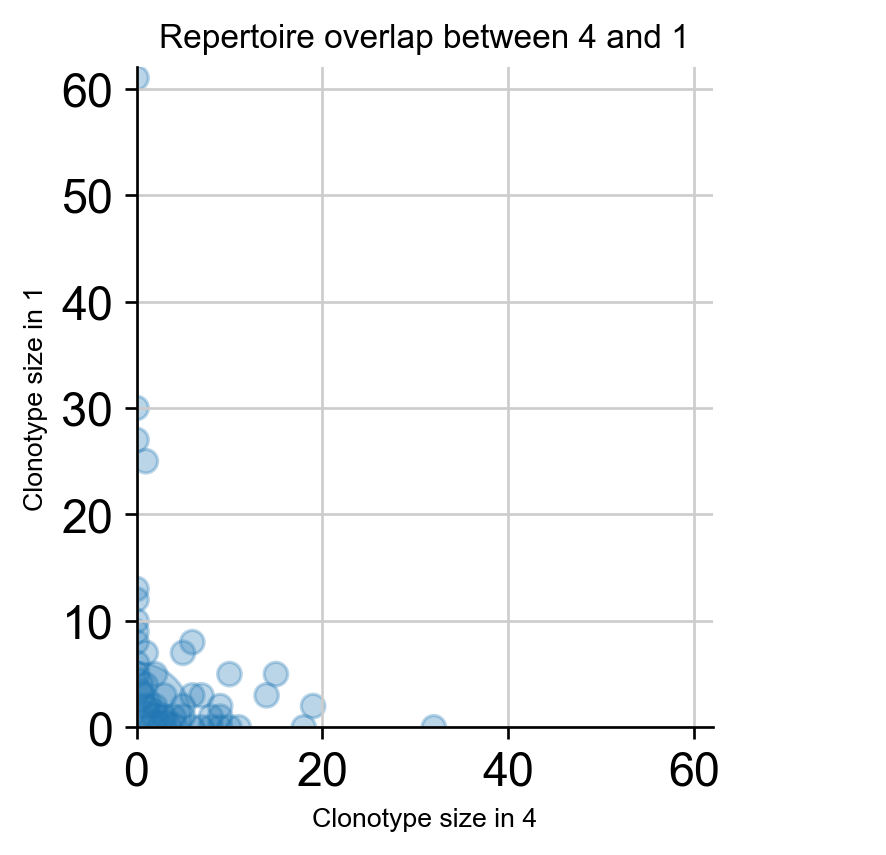

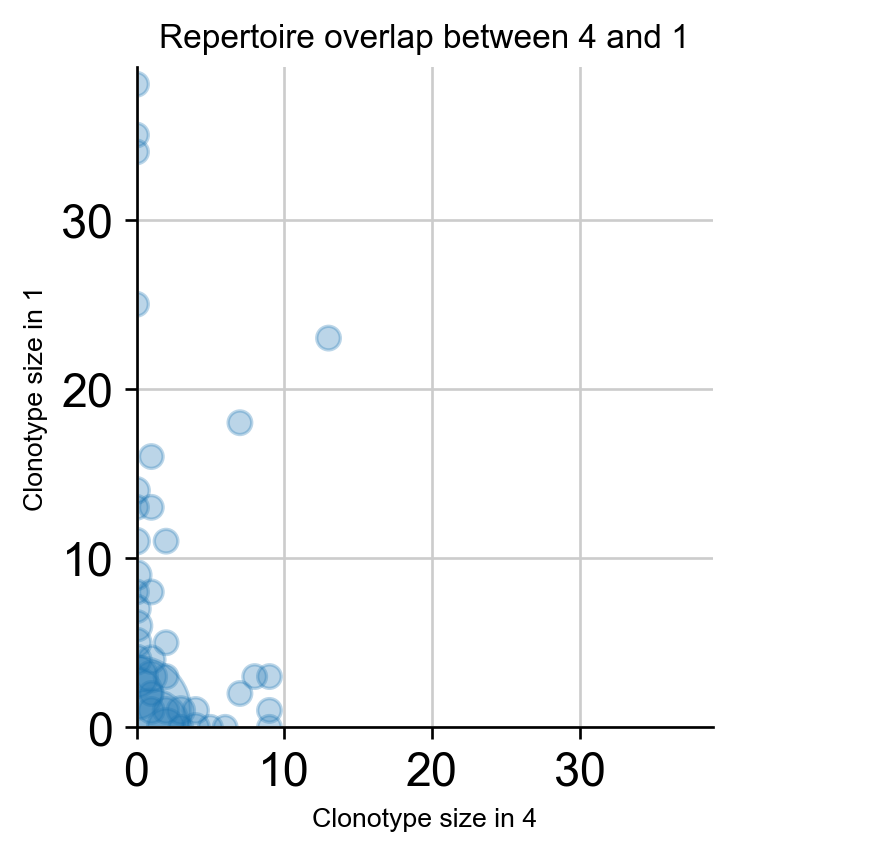

In [117]:
##Repertoire overlap between cluster 4 and cluster 1------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["4", "1"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_1_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 4 and cluster 1-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["4", "1"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_1_WT.pdf', bbox_inches='tight')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


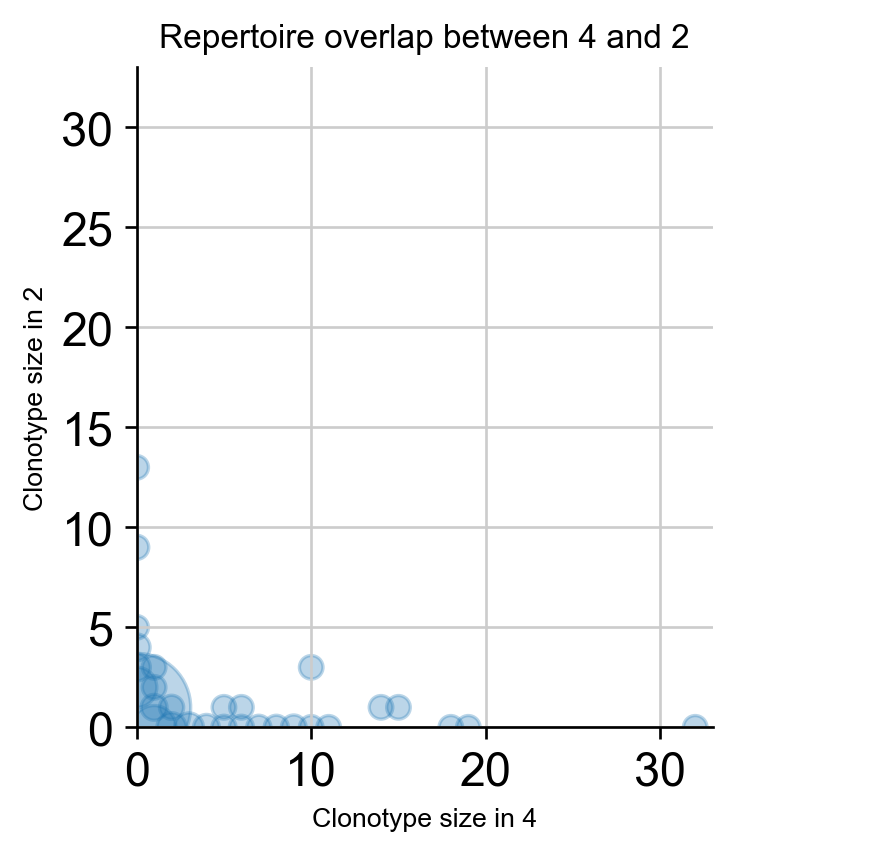

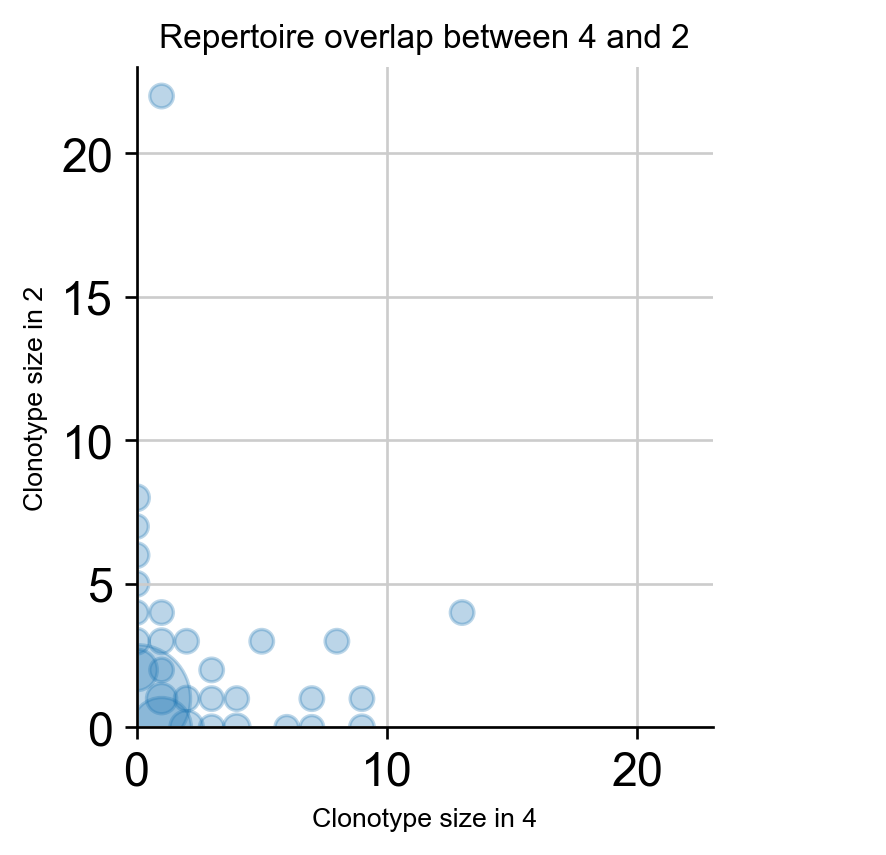

In [118]:
##Repertoire overlap between cluster 4 and cluster 2------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["4", "2"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_2_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 4 and cluster 2-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["4", "2"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_2_WT.pdf', bbox_inches='tight')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


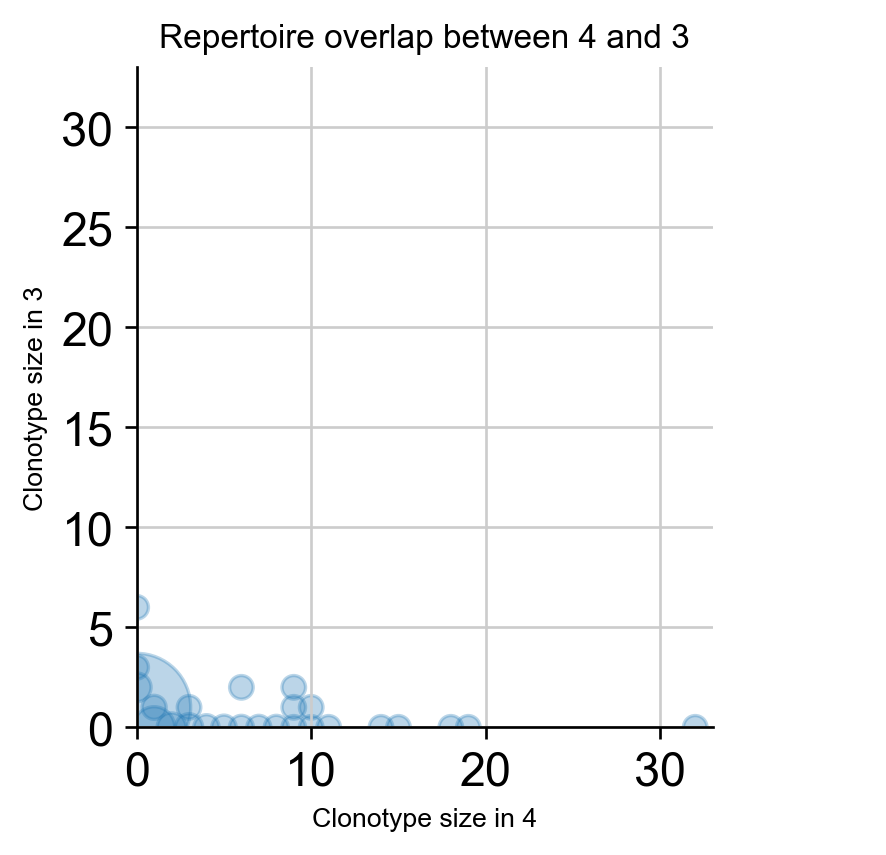

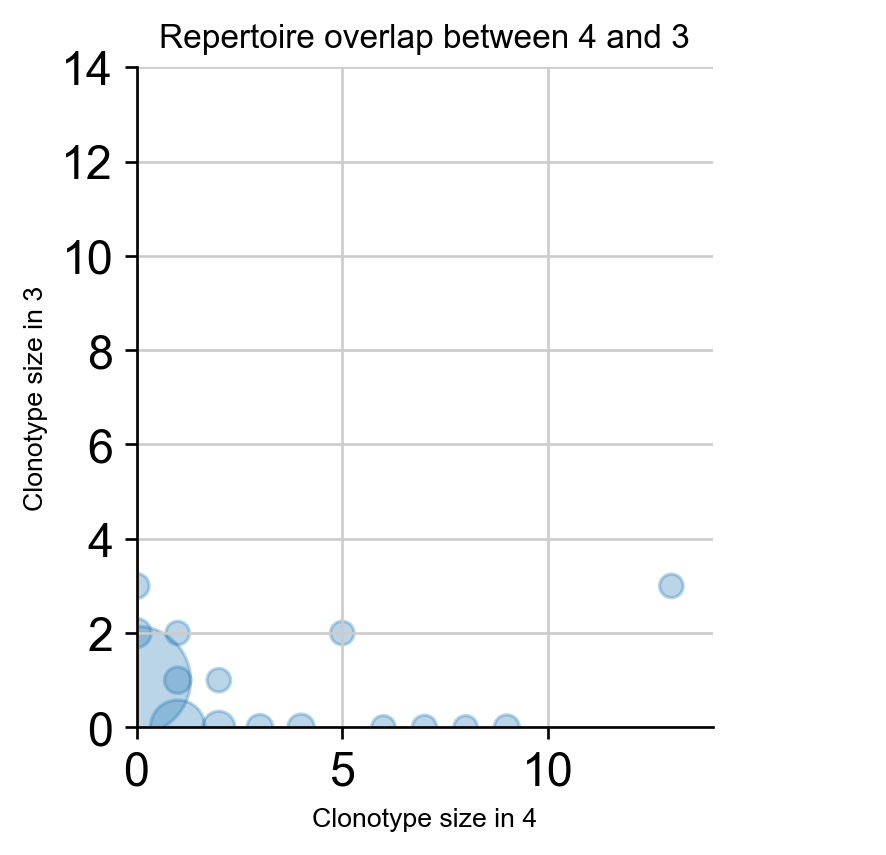

In [119]:
##Repertoire overlap between cluster 4 and cluster 3------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["4", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_3_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 4 and cluster 3-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["4", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_4_3_WT.pdf', bbox_inches='tight')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


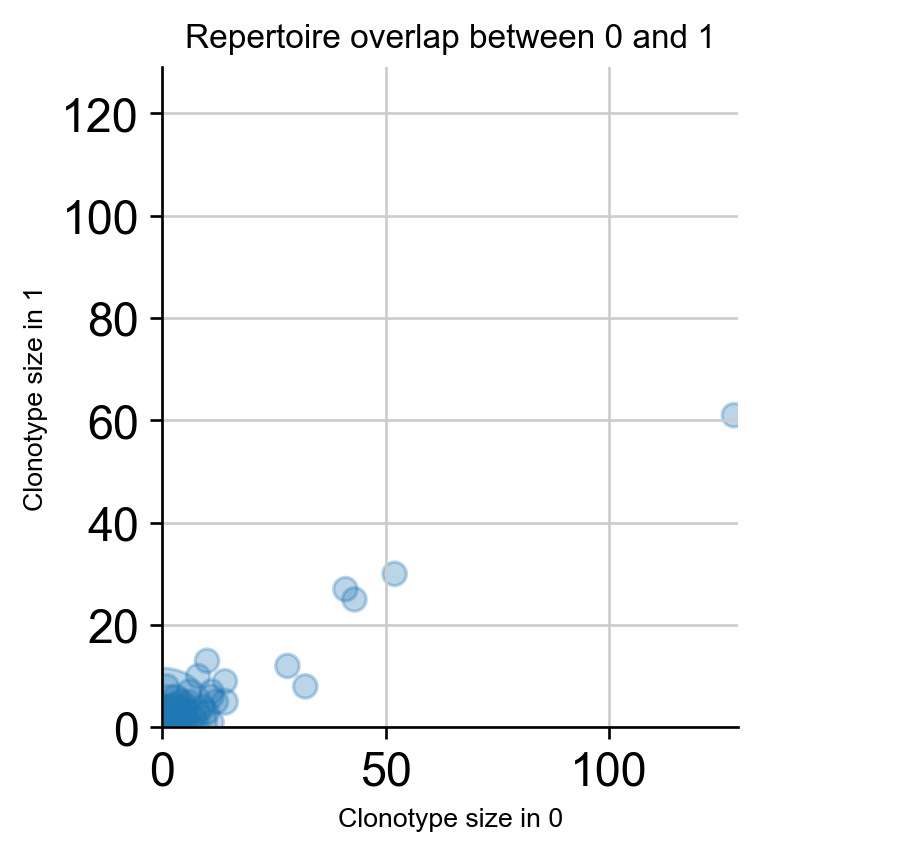

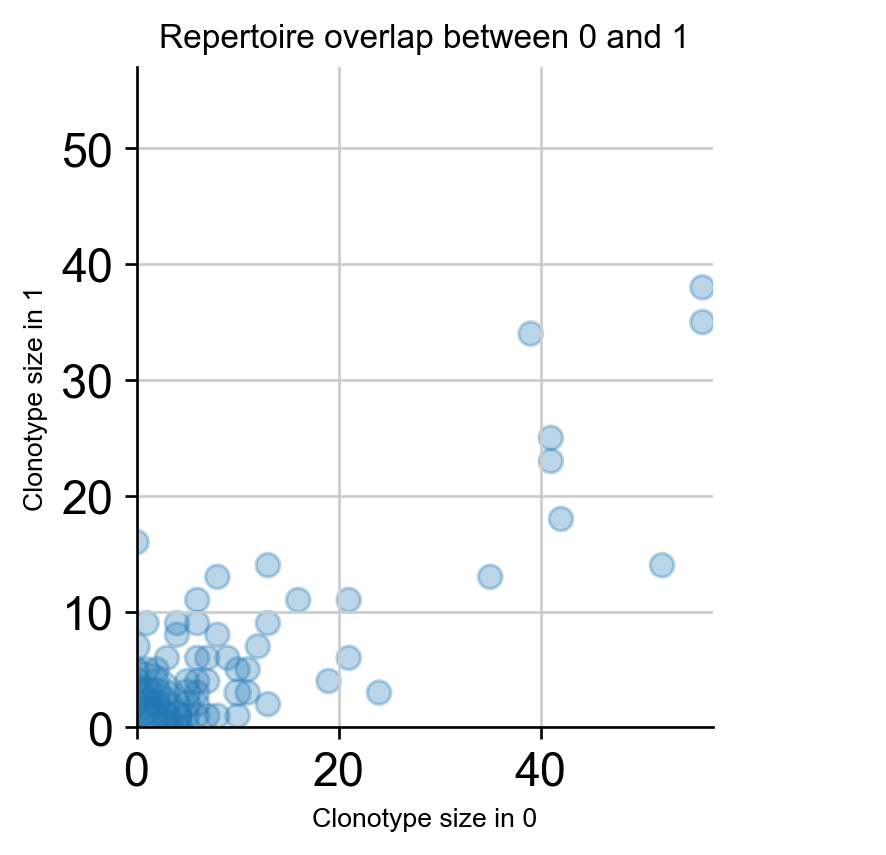

In [124]:
##Repertoire overlap between cluster 0 and cluster 1------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["0", "1"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_0_1_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 0 and cluster 1-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["0", "1"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_0_1_WT.pdf', bbox_inches='tight')



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


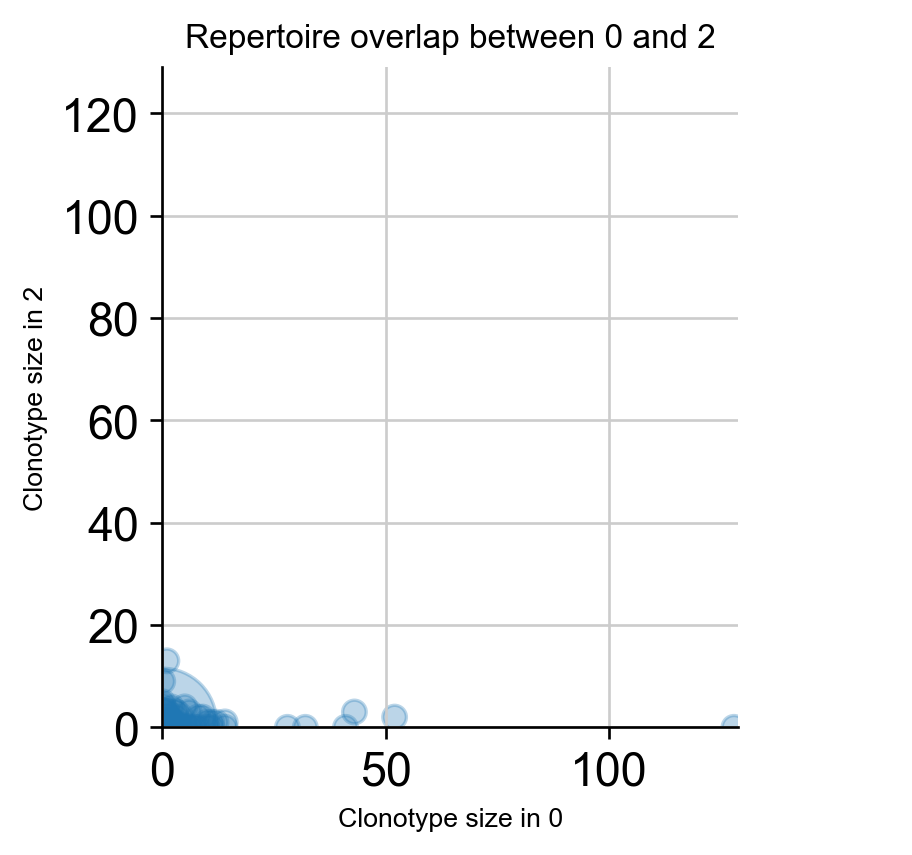

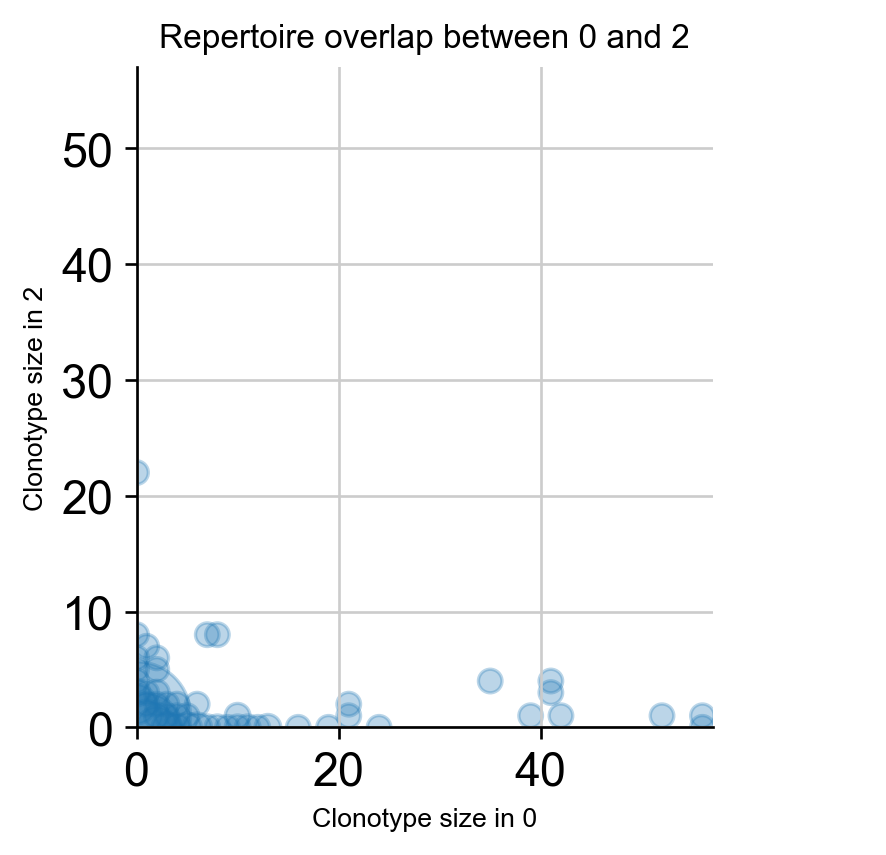

In [121]:
##Repertoire overlap between cluster 0 and cluster 2------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["0", "2"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_0_2_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 0 and cluster 2-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["0", "2"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_0_2_WT.pdf', bbox_inches='tight')



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


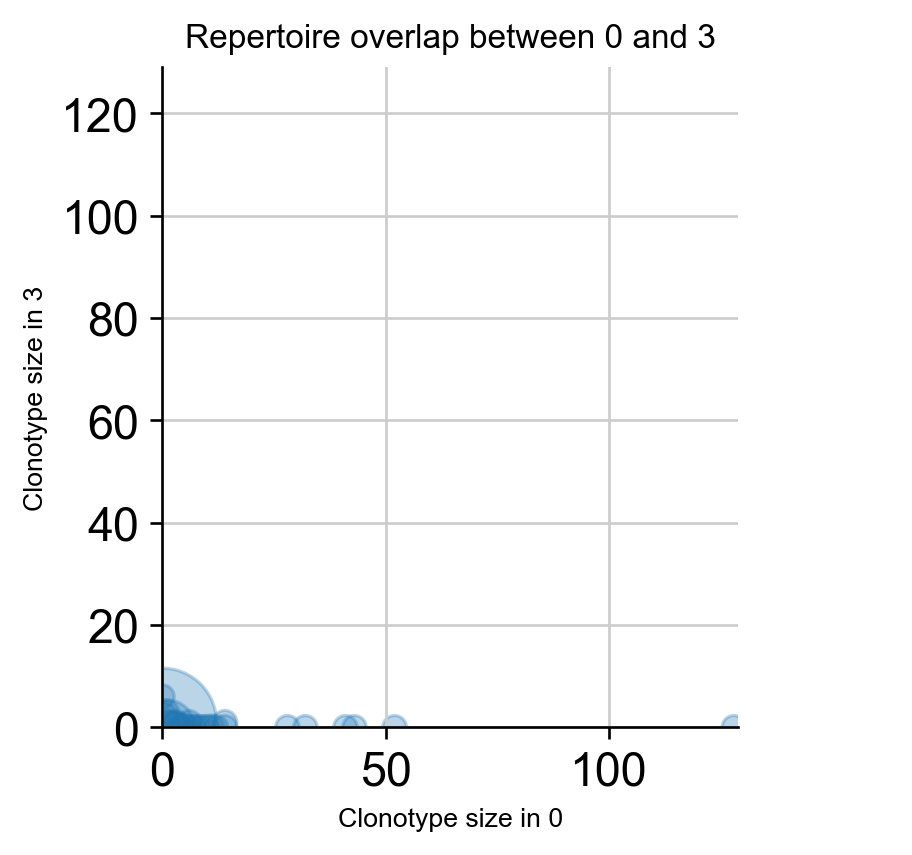

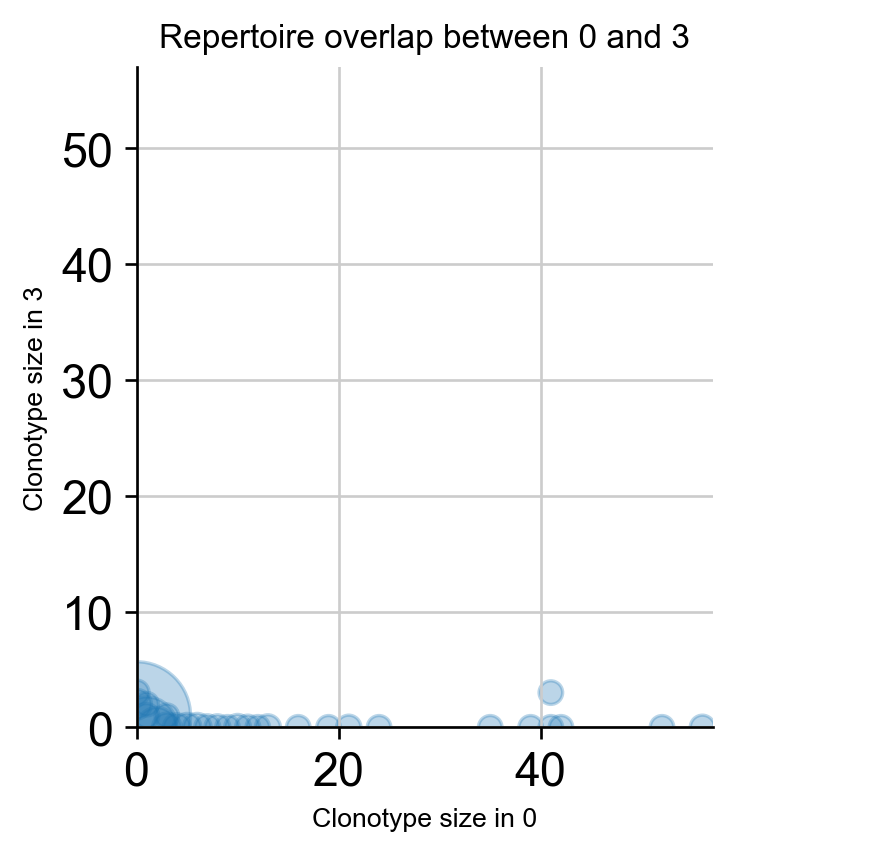

In [122]:
##Repertoire overlap between cluster 0 and cluster 3------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["0", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_0_3_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 0 and cluster 3-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["0", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_0_3_WT.pdf', bbox_inches='tight')



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


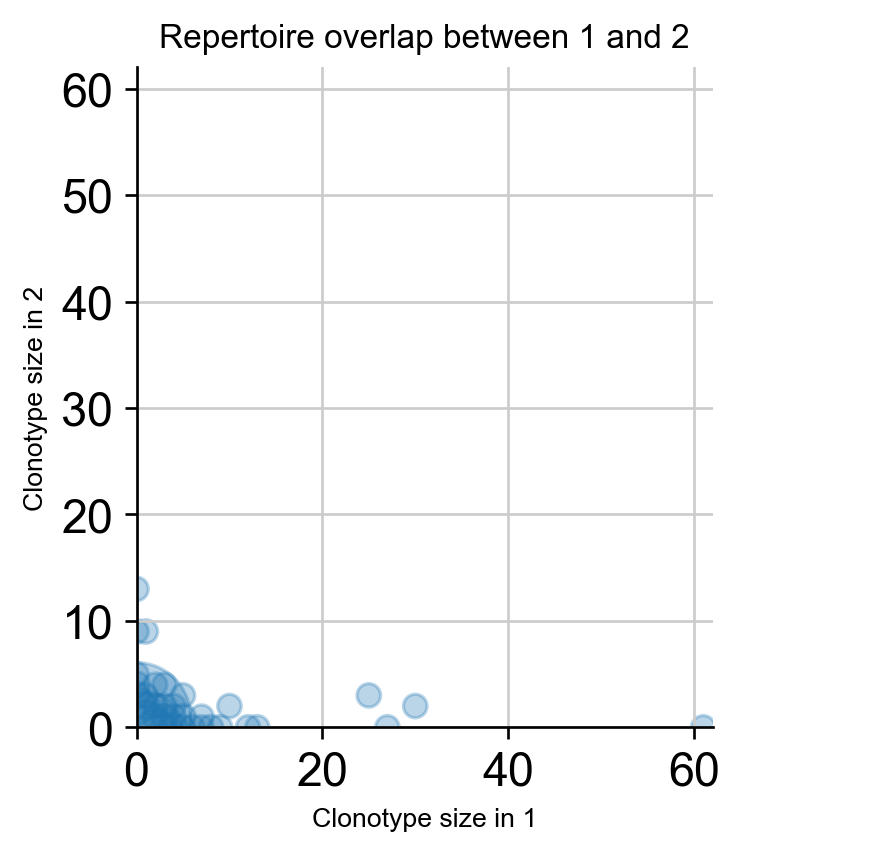

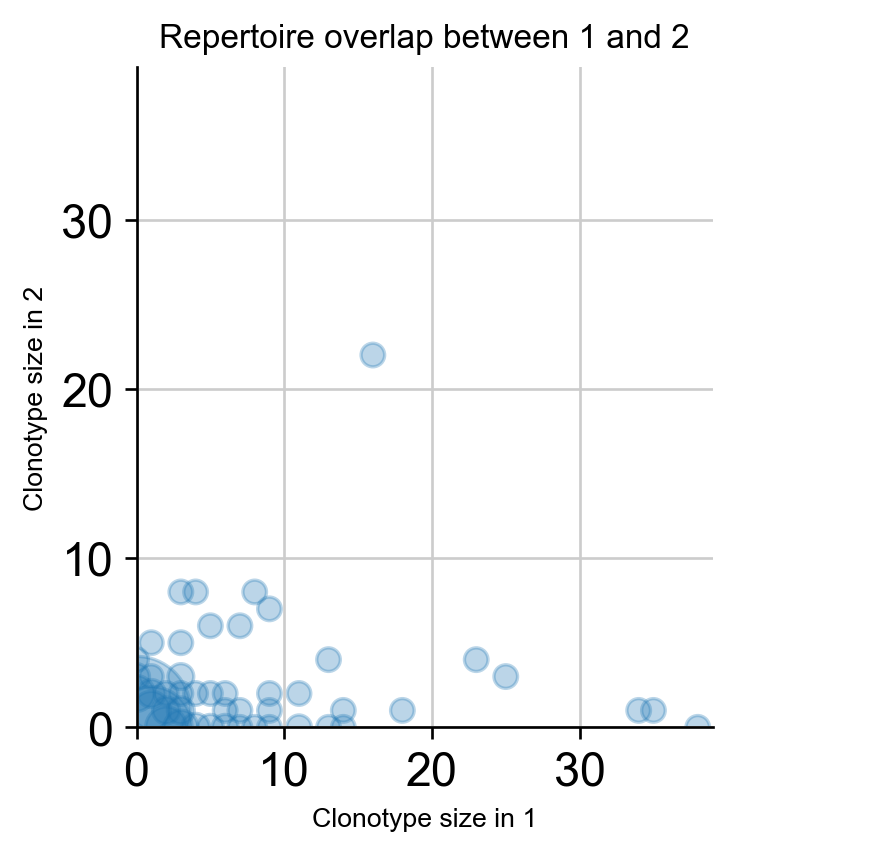

In [125]:
##Repertoire overlap between cluster 1 and cluster 2------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["1", "2"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_1_2_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 1 and cluster 2-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["1", "2"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_1_2_WT.pdf', bbox_inches='tight')



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


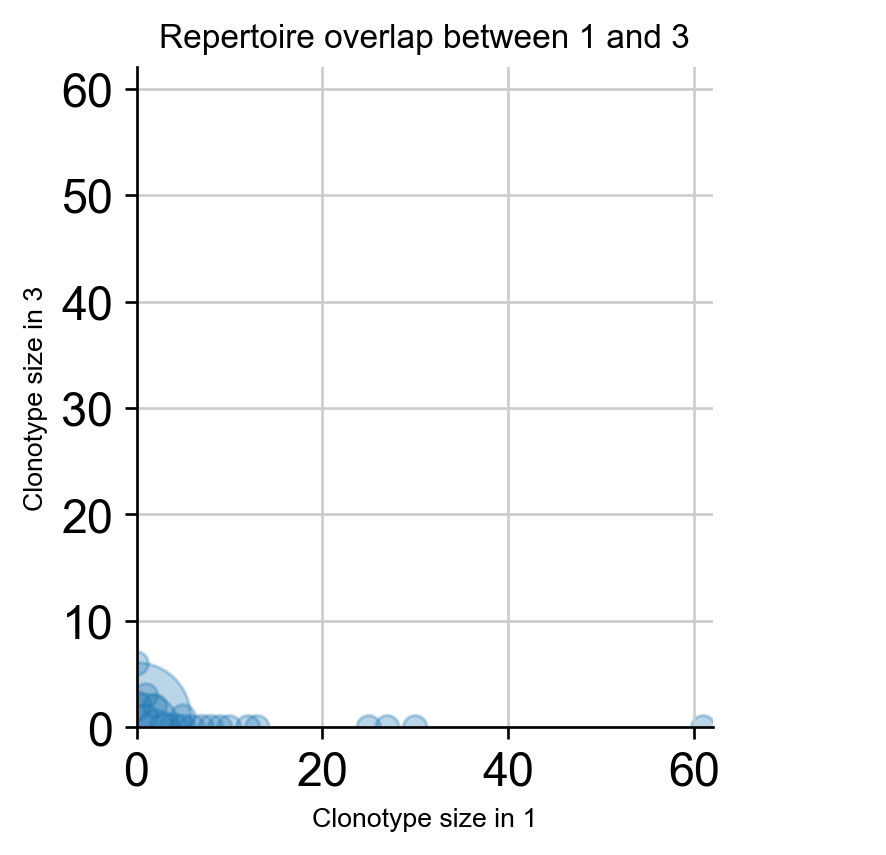

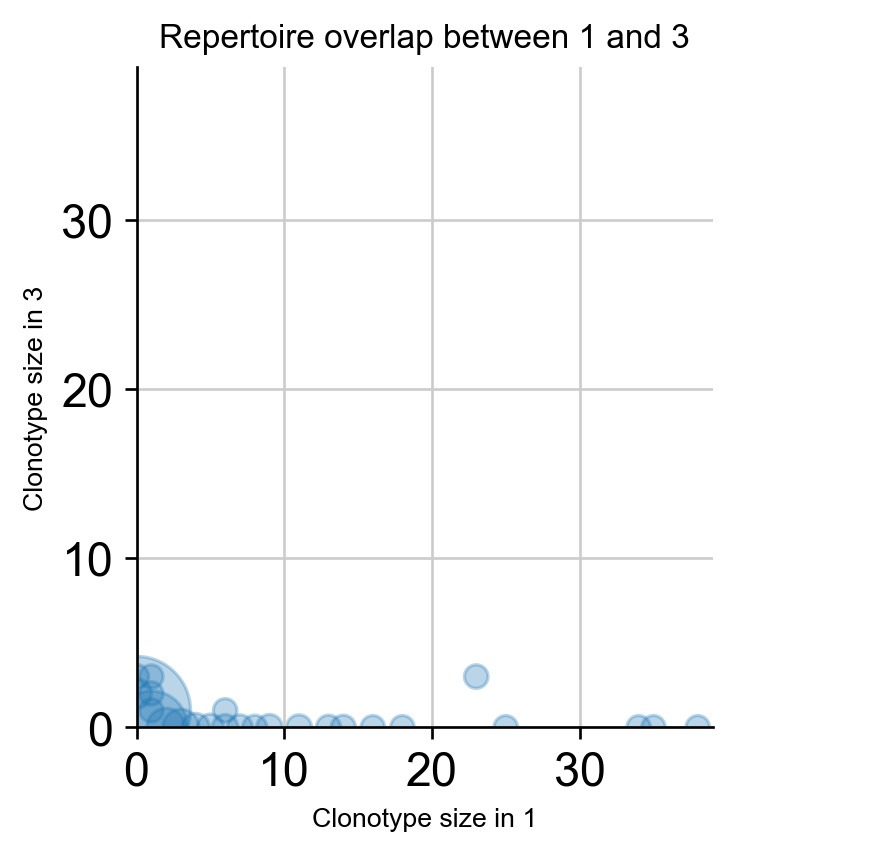

In [126]:
##Repertoire overlap between cluster 1 and cluster 3------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["1", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_1_3_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 1 and cluster 3-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["1", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_1_3_WT.pdf', bbox_inches='tight')



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


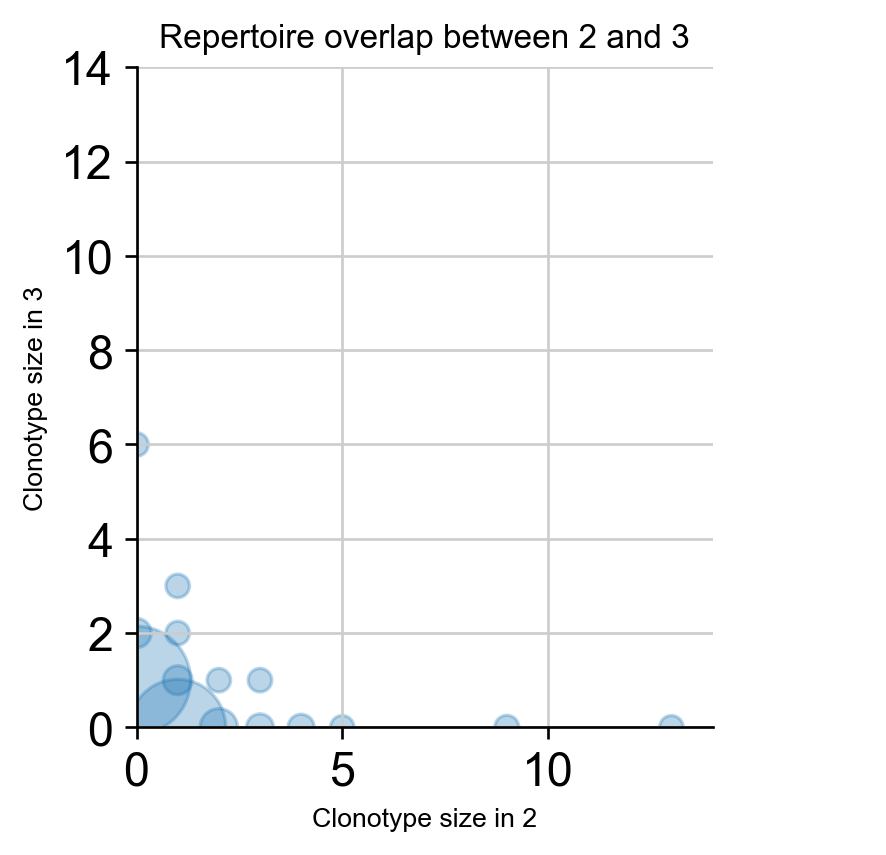

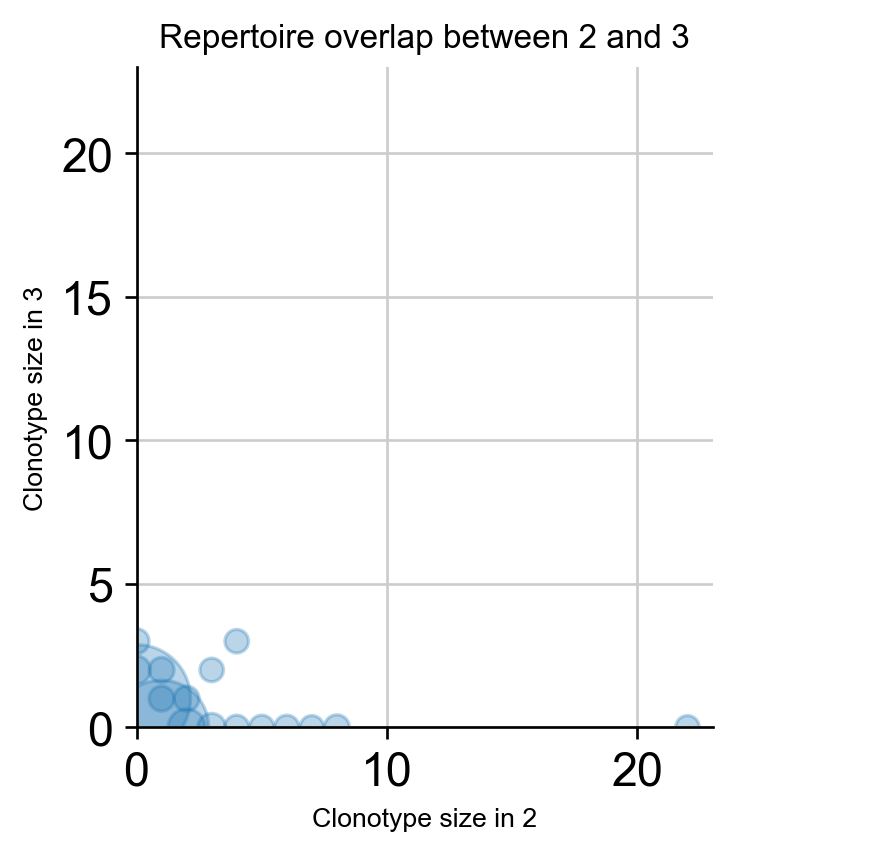

In [127]:
##Repertoire overlap between cluster 2 and cluster 3------KO
ir.tl.repertoire_overlap(adata_ko, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_ko, "seurat_clusters", pair_to_plot=["2", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_2_3_KO.pdf', bbox_inches='tight')


##Repertoire overlap between cluster 2 and cluster 3-----WT
ir.tl.repertoire_overlap(adata_wt, "seurat_clusters")
ir.pl.repertoire_overlap(
    adata_wt, "seurat_clusters", pair_to_plot=["2", "3"], fig_kws={"dpi": 120}
)
plt.savefig(fig_dir+'TCR_overlap_2_3_WT.pdf', bbox_inches='tight')



In [129]:
freq, stat = ir.tl.clonotype_imbalance(
    adata,
    replicate_col="Group",
    groupby="seurat_clusters",
    case_label="4",
    control_label="0",
    inplace=False,
)
top_differential_clonotypes = stat["clone_id"].tolist()[:3]

/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/scirpy/io/_util.py:71: FutureWarning: clonotype_imbalance is a deprecated function and will be removed in a future version of scirpy. Consider using `tl.clonotype_modularity` instead. If `clonotype_modularity` does not cover your use-case, please create an issue on GitHub to let us know such that we can take it into account! (https://github.com/scverse/scirpy/issues)
  return f(*args, **kwargs)


In [132]:
top_differential_clonotypes

['895', '3', '95']

In [ ]:
#sc.pl.umap(adata, color="seurat_clusters", ax=ax1, show=False)
sc.pl.umap(
    adata,
    color="clone_id",
    groups=['895', '3', '95'],
    #ax=ax2,
    # increase size of highlighted dots
    #size=[
        #80 if c in top_differential_clonotypes else 30 for c in adata.obs["clone_id"]
    #],
    #palette=cycler(color=mpl_cm.Dark2_r.colors),
)

## change to dandelion

In [141]:
adata_dan = ir.io.to_dandelion(adata)
adata_dan

Dandelion class object with n_obs = 5411 and n_contigs = 10263
    data: 'sequence_id', 'sequence', 'rev_comp', 'productive', 'v_call', 'd_call', 'j_call', 'sequence_alignment', 'germline_alignment', 'junction', 'junction_aa', 'v_cigar', 'd_cigar', 'j_cigar', 'c_call', 'consensus_count', 'duplicate_count', 'locus', 'cell_id', 'multi_chain', 'clonal_expansion', 'seurat_clusters', 'percent.rb', 'high_confidence', 'hash.ID', 'HTO_classification', 'percent.mt', 'nCount_HTO', 'Group', 'clone_id_size', 'nFeature_HTO', 'RNA_snn_res.0.5', 'HTO_secondID', 'clonal_expansion_cut', 'RNA_snn_res.0.36', 'RNA_snn_res.0.35', 'is_cell', 'RNA_snn_res.0.4', 'HTO_maxID', 'HTO_margin', 'RNA_snn_res.0.2', 'nFeature_RNA', 'receptor_subtype', 'RNA_snn_res.0.38', 'RNA_snn_res.0.3', 'receptor_type', 'chain_pairing', 'nCount_RNA', 'RNA_snn_res.0.25', 'clone_id', 'rearrangement_status'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_V

In [147]:
ddl.tl.clone_overlap(adata,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap=True)

Finding clones
 finished (0:00:00)


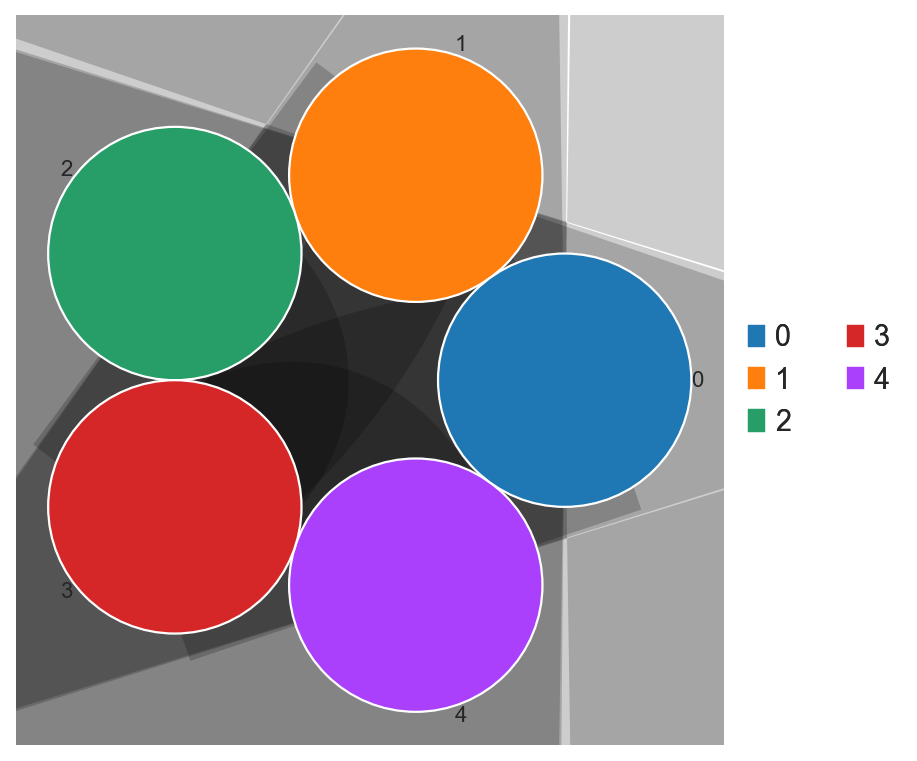

In [158]:
sc.set_figure_params(figsize = [6,6])
ddl.pl.clone_overlap(adata,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap=True)

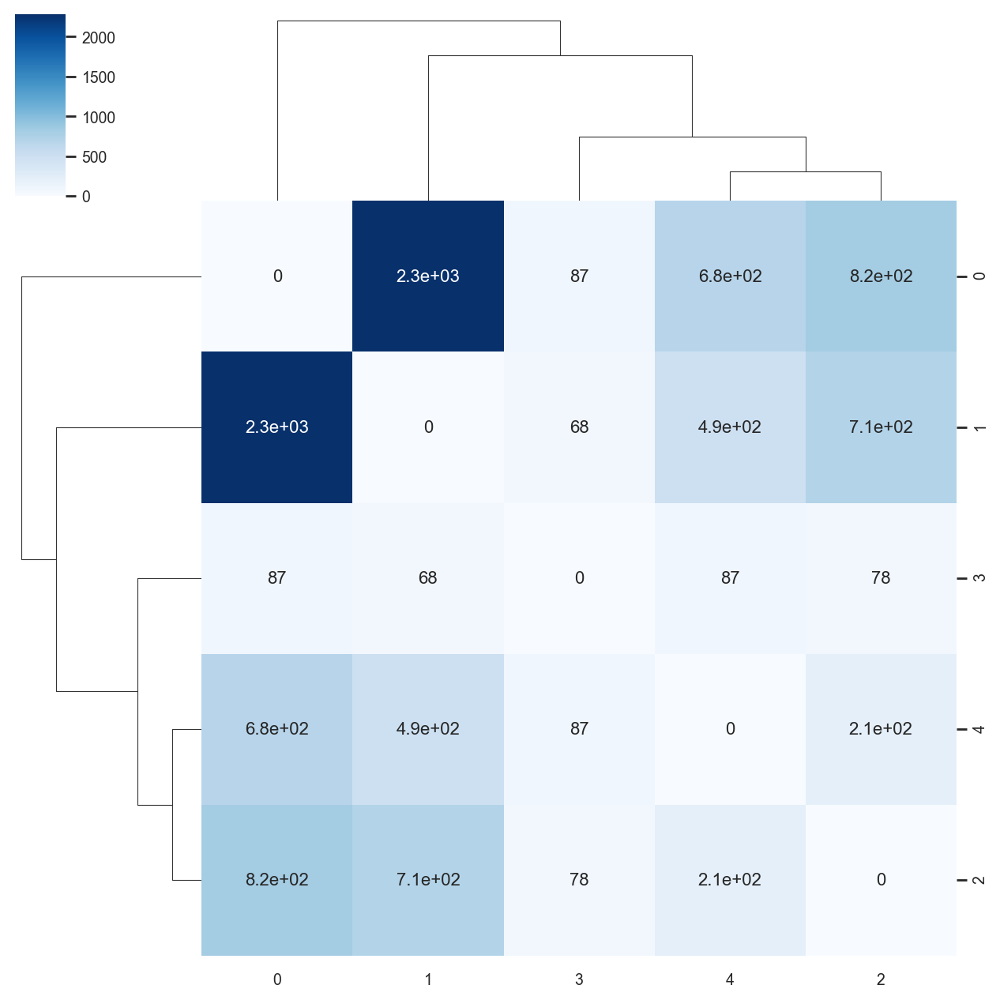

In [228]:
import seaborn as sns
sns.set(font_scale=.8)
ddl.pl.clone_overlap(adata,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap = True, as_heatmap = True,
                     # seaborn clustermap kwargs
                     cmap = 'Blues', annot = True, figsize=(8,8), annot_kws={"size": 10})


plt.savefig(fig_dir+'TCR_overlap_overall_dandelion.pdf', bbox_inches='tight')

Finding clones
 finished (0:00:00)


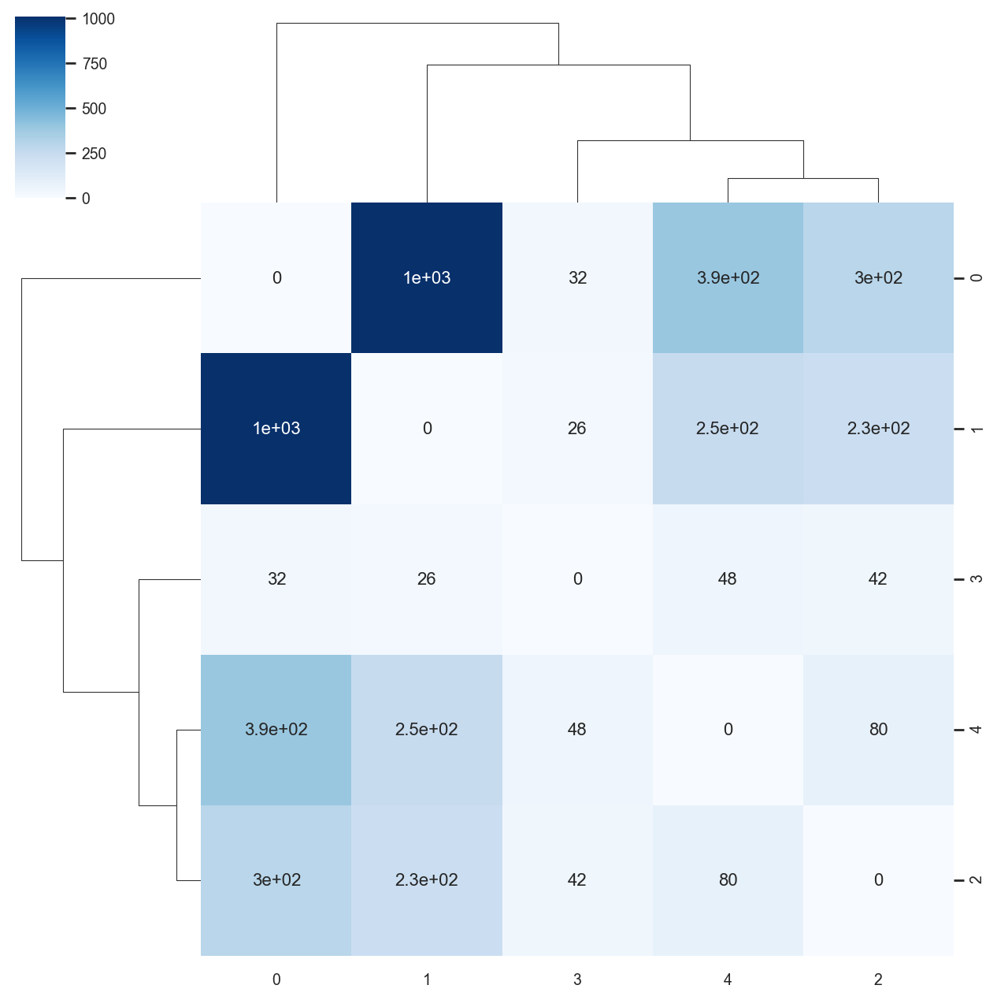

In [229]:
### KO
ddl.tl.clone_overlap(adata_ko,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap=True)
sns.set(font_scale=.8)
ddl.pl.clone_overlap(adata_ko,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap = True, as_heatmap = True,
                     # seaborn clustermap kwargs
                     cmap = 'Blues', annot = True, figsize=(8,8), annot_kws={"size": 10})

plt.savefig(fig_dir+'TCR_overlap_KO_dandelion.pdf', bbox_inches='tight')

Finding clones
 finished (0:00:00)


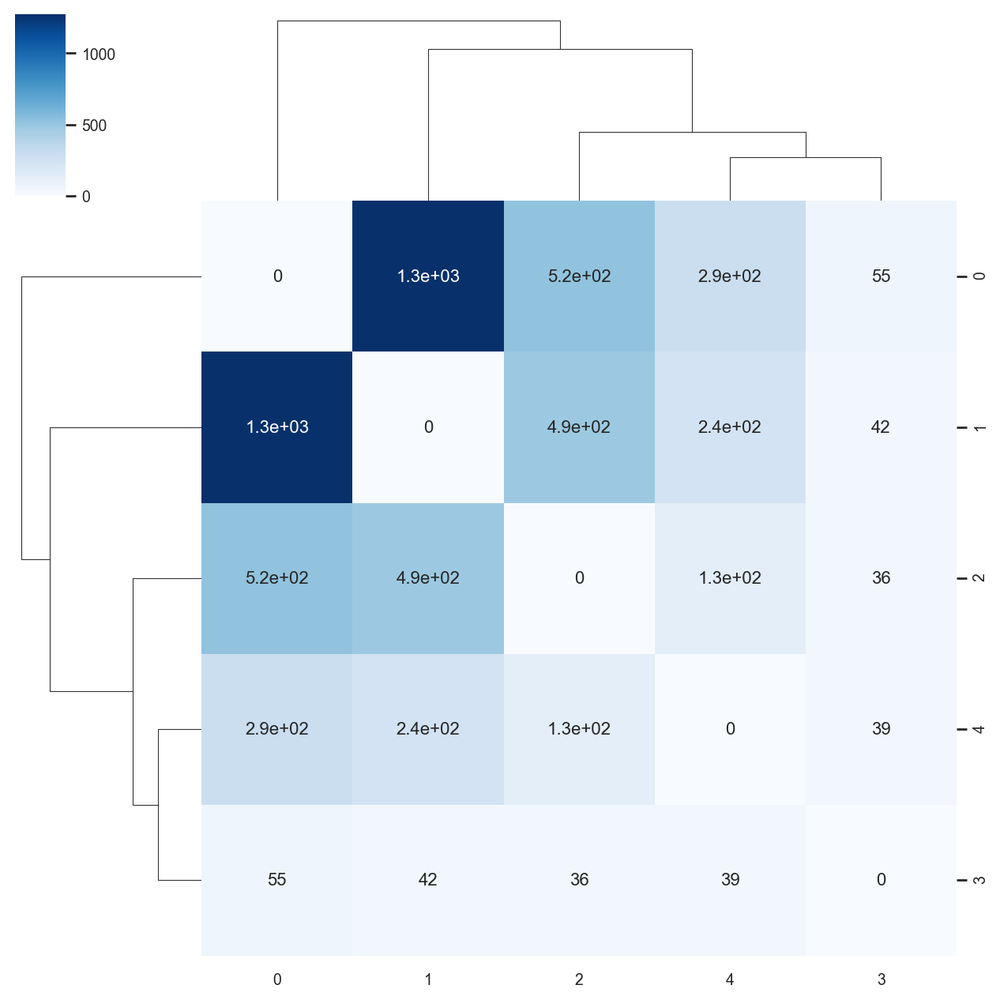

In [230]:
### WT
ddl.tl.clone_overlap(adata_wt,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap=True)
sns.set(font_scale=.8)
ddl.pl.clone_overlap(adata_wt,
                     groupby = 'seurat_clusters',
                     colorby = 'seurat_clusters',
                     weighted_overlap = True, as_heatmap = True,
                     # seaborn clustermap kwargs
                     cmap = 'Blues', annot = True, figsize=(8,8), annot_kws={"size": 10})

plt.savefig(fig_dir+'TCR_overlap_WT_dandelion.pdf', bbox_inches='tight')

In [ ]:
adata1 = adata

In [172]:
adata1.obs_keys()

['nCount_RNA',
 'nFeature_RNA',
 'nCount_HTO',
 'nFeature_HTO',
 'percent.mt',
 'percent.rb',
 'HTO_maxID',
 'HTO_secondID',
 'HTO_margin',
 'HTO_classification',
 'hash.ID',
 'Group',
 'RNA_snn_res.0.5',
 'seurat_clusters',
 'RNA_snn_res.0.3',
 'RNA_snn_res.0.4',
 'RNA_snn_res.0.2',
 'RNA_snn_res.0.25',
 'RNA_snn_res.0.35',
 'RNA_snn_res.0.38',
 'RNA_snn_res.0.36',
 'is_cell',
 'high_confidence',
 'multi_chain',
 'extra_chains',
 'IR_VJ_1_c_call',
 'IR_VJ_2_c_call',
 'IR_VDJ_1_c_call',
 'IR_VDJ_2_c_call',
 'IR_VJ_1_consensus_count',
 'IR_VJ_2_consensus_count',
 'IR_VDJ_1_consensus_count',
 'IR_VDJ_2_consensus_count',
 'IR_VJ_1_d_call',
 'IR_VJ_2_d_call',
 'IR_VDJ_1_d_call',
 'IR_VDJ_2_d_call',
 'IR_VJ_1_duplicate_count',
 'IR_VJ_2_duplicate_count',
 'IR_VDJ_1_duplicate_count',
 'IR_VDJ_2_duplicate_count',
 'IR_VJ_1_j_call',
 'IR_VJ_2_j_call',
 'IR_VDJ_1_j_call',
 'IR_VDJ_2_j_call',
 'IR_VJ_1_junction',
 'IR_VJ_2_junction',
 'IR_VDJ_1_junction',
 'IR_VDJ_2_junction',
 'IR_VJ_1_junction

In [ ]:
ddl.tl.setup_vdj_pseudobulk(adata1,
    mode = None,
    extract_cols = ['IR_VDJ_1_v_gene', 'IR_VDJ_1_j_gene', 'IR_VJ_1_v_gene', 'IR_VJ_1_j_gene'],
    check_extract_cols_mapping = ['IR_VDJ_1_v_gene', 'IR_VDJ_1_j_gene', 'IR_VJ_1_v_gene', 'IR_VJ_1_j_gene']) # this should be identical to extract_cols

### palantir

#### difusion map

In [180]:
# Run diffusion maps
import palantir
pca_projections = pd.DataFrame(adata1.obsm['X_pca'], index=adata.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=5) 

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


Determing nearest neighbor graph...
computing neighbors
    finished (0:00:01)


In [181]:
ms_data = palantir.utils.determine_multiscale_space(dm_res)

In [186]:
adata1.obsm

AxisArrays with keys: X_harmony_theta2, X_pca, X_umap, X_clonotype_network

In [188]:
# select the start and end points
# start
tmp = adata1[adata1.obs['seurat_clusters'] == '3']
rootcell = np.argmin(tmp.obsm['X_umap'][:,0])
rootcell = tmp.obs_names[rootcell]
adata1.obs['rootcell'] = 0
adata1.obs.loc[rootcell,'rootcell'] = 1


pr_res = palantir.core.run_palantir(ms_data,  rootcell, num_waypoints=500, 
                                    )

Sampling and flocking waypoints...
Time for determining waypoints: 0.02167005936304728 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling bac

Time for shortest paths: 0.16684029897054037 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/palantir/core.py:379: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/palantir/core.py:447: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Users/chengyuye/miniconda3/envs/single-cell/lib/python3.8/site-packages/palantir/core.py:450: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


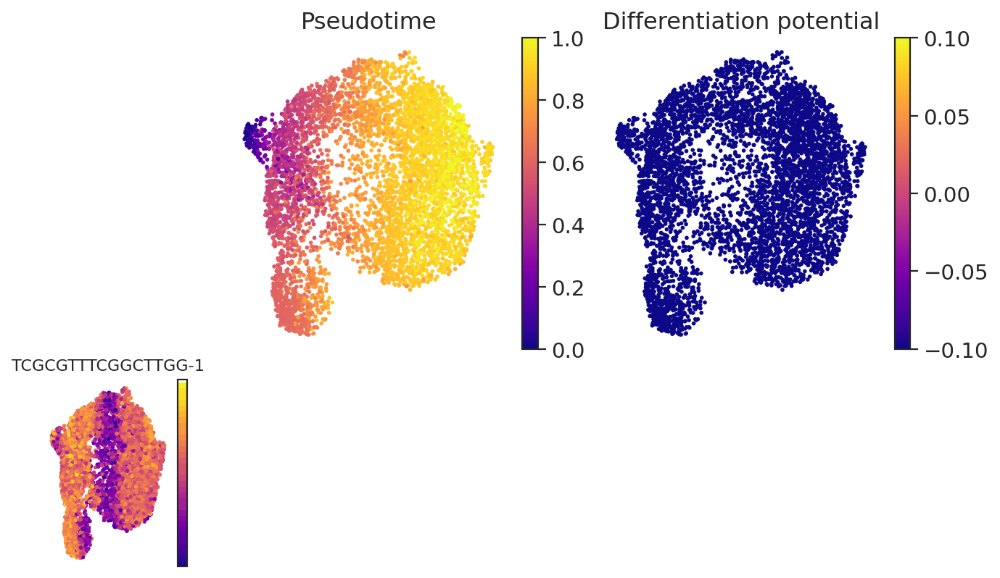

In [201]:
umap = pd.DataFrame(adata1.obsm['X_umap'],  index=adata1.obs_names, columns=['x', 'y'])
palantir.plot.plot_palantir_results(pr_res, umap)

In [218]:
del adata.uns['clonotype_imbalance']

In [219]:
adata.write('/Users/chengyuye/Library/CloudStorage/OneDrive-EmoryUniversity/Rotation_2_Li Lab/scRNA_TCR/Data/processed_data/adipose/scanpy_update/subset_harmony_scirpy_dandelion.h5ad')

In [214]:
adata.obs_keys()

['nCount_RNA',
 'nFeature_RNA',
 'nCount_HTO',
 'nFeature_HTO',
 'percent.mt',
 'percent.rb',
 'HTO_maxID',
 'HTO_secondID',
 'HTO_margin',
 'HTO_classification',
 'hash.ID',
 'Group',
 'RNA_snn_res.0.5',
 'seurat_clusters',
 'RNA_snn_res.0.3',
 'RNA_snn_res.0.4',
 'RNA_snn_res.0.2',
 'RNA_snn_res.0.25',
 'RNA_snn_res.0.35',
 'RNA_snn_res.0.38',
 'RNA_snn_res.0.36',
 'is_cell',
 'high_confidence',
 'multi_chain',
 'extra_chains',
 'IR_VJ_1_c_call',
 'IR_VJ_2_c_call',
 'IR_VDJ_1_c_call',
 'IR_VDJ_2_c_call',
 'IR_VJ_1_consensus_count',
 'IR_VJ_2_consensus_count',
 'IR_VDJ_1_consensus_count',
 'IR_VDJ_2_consensus_count',
 'IR_VJ_1_d_call',
 'IR_VJ_2_d_call',
 'IR_VDJ_1_d_call',
 'IR_VDJ_2_d_call',
 'IR_VJ_1_duplicate_count',
 'IR_VJ_2_duplicate_count',
 'IR_VDJ_1_duplicate_count',
 'IR_VDJ_2_duplicate_count',
 'IR_VJ_1_j_call',
 'IR_VJ_2_j_call',
 'IR_VDJ_1_j_call',
 'IR_VDJ_2_j_call',
 'IR_VJ_1_junction',
 'IR_VJ_2_junction',
 'IR_VDJ_1_junction',
 'IR_VDJ_2_junction',
 'IR_VJ_1_junction

### milo for dandelion

In [ ]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
#import logging

In [227]:
import milopy
import milopy.core as milo
import milopy.plot as milopl
milo.make_nhoods(adata1, prop=0.1)

MemoryError: Cannot allocate write+execute memory for ffi.callback(). You might be running on a system that prevents this. For more information, see https://cffi.readthedocs.io/en/latest/using.html#callbacks